In [ ]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 31.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=9a310b5c430c24559355e3e8c68b990475390eb7472d1474e64d48a9dc7b46f5
  Stored in directory: /root/.cache/pip/wheels/90/61/ec/9dbe9efc3acf9c4e37ba70fbbcc3f3a0ebd121060aa593181a
  Created wheel for sklearn: filename=sklearn-0.0.post1-py3-none-any.whl size=2344 sha256=d673e70fcdb3fd1161b32043682abd33191ae23ef694c3b100eeaa925f70d927
  Stored in directory: /root/.cache/pip/wheels/14/25/f7/1cc0956978ae479e75140219088deb7a36f60459df242b1a72
Successfully built pyLDAvis sklearn


In [ ]:
!pip install pytrends 
!pip install psutil requests
import pandas as pd
import pytrends
from pytrends.request import TrendReq
import pandas as pd
import re
from datetime import datetime
import time
from scipy.stats import spearmanr
import plotly.express as px
from scipy import stats
import nltk
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly import tools as tls
import plotly.graph_objs as go
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt
from nltk import tokenize
import matplotlib as plt
from matplotlib import *
import sys
from pylab import *
import seaborn as sns
from wordcloud import WordCloud
import gensim
from gensim.utils import simple_preprocess
nltk.download('stopwords')
from nltk.corpus import stopwords
import gensim.corpora as corpora
from pprint import pprint
from gensim.models.coherencemodel import CoherenceModel
from google.colab import drive

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.8/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working

/usr/local/lib/python3.8/dist-packages/past/builtins/misc.py:4: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working

/usr/local/lib/python3.8/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning:

`scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#Data

##Cryptopunks Dataset

In [ ]:
df_cryp = pd.read_csv('https://raw.githubusercontent.com/SunYutongAmber/Cryptopunks_tweets_data_analysis/main/data/queried_tweets_data_4years.csv').drop(["Unnamed: 0"], axis = 1)
df_cryp

,Date,Tweets
0,2021-07-22 22:01:18+00:00,WE LIVE with @DanVerno \n ⭐The CryptoPunk Come...
1,2021-07-22 21:00:41+00:00,"NFT community, assemble! 😂 I am looking for th..."
2,2021-07-22 19:01:23+00:00,11 HOURS LEFT TO OWN A PIECE OF THE BURNT CRYP...
3,2021-07-22 17:44:22+00:00,I see a cryptopunk pfp and instantly think a c...
4,2021-07-22 17:32:14+00:00,I’m going to spend a little Eth On a new #NFT ...
...,...,...
7469,2017-08-17 22:36:57+00:00,Got me some $NEO $OMG $BAT $SNT $CVC come on n...
7470,2017-08-14 20:05:06+00:00,What did you do today? did you panic sell or #...
7471,2017-08-12 18:31:07+00:00,@Arman112358 Lol falling $NEO https://t.co/4f7...
7472,2017-08-10 20:29:44+00:00,Boom $NEO


##Data Cleaning


1) Remove punctuation 

2) Convert the titles to lowercase 


In [ ]:
def clean_data(df):
  #df['paper_text_processed'] = \
  df['Tweets']=df['Tweets'].map(lambda x: re.sub('[,\.!?]', '', str(x)))
  df['Tweets']=df['Tweets'].map(lambda x: re.sub('s', '', str(x)))
  #df['paper_text_processed'] = \
  df['paper_text_processed'].map(lambda x: x.lower())
  #df['paper_text_processed'].map(lambda x: re.sub('s', '', str(x)))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).strip('s'))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('#nft','nft'))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('#',''))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('$',''))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('nfts','nft'))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('cryptopunks','cryptopunk'))
  df['paper_text_processed']=df['paper_text_processed'].map(lambda x: str(x).replace('nftcollectors','nftcollector'))
  #df['paper_text_processed'].map(lambda x: str(x).replace('$',''))nftcollectors	
  
  return df

<>:3: DeprecationWarning:

invalid escape sequence \.

<>:3: DeprecationWarning:

invalid escape sequence \.

<ipython-input-119-546d41bd4326>:3: DeprecationWarning:

invalid escape sequence \.



In [ ]:
df_cryp=clean_data(df_cryp)
df_cryp

,Date,Tweets,paper_text_processed,tweet_without_stopwords
0,2021-07-22 22:01:18+00:00,WE LIVE with @DanVerno \n ⭐The CryptoPunk Come...,we live with @danverno \n ⭐the cryptopunk come...,live @danverno ⭐the cryptopunk come story ⭐nft...
1,2021-07-22 21:00:41+00:00,NFT community aemble 😂 I am looking for the ow...,nft community assemble 😂 i am looking for the ...,nft community assemble 😂 looking owner cryptop...
2,2021-07-22 19:01:23+00:00,11 HOURS LEFT TO OWN A PIECE OF THE BURNT CRYP...,11 hours left to own a piece of the burnt cryp...,11 hour left piece burnt cryptopunk https://tc...
3,2021-07-22 17:44:22+00:00,I ee a cryptopunk pfp and intantly think a cou...,i see a cryptopunk pfp and instantly think a c...,see cryptopunk pfp instantly think couple thin...
4,2021-07-22 17:32:14+00:00,I’m going to pend a little Eth On a new #NFT I...,i’m going to spend a little eth on a new nft i...,i’m going spend little eth new nft think top p...
...,...,...,...,...
7469,2017-08-17 22:36:57+00:00,Got me ome $NEO $OMG $BAT $SNT $CVC come on no...,got me some neo omg bat snt cvc come on now i ...,got neo omg bat snt cvc come got lambos pay &g...
7470,2017-08-14 20:05:06+00:00,What did you do today did you panic ell or #HO...,what did you do today did you panic sell or ho...,today panic sell hodl bat omg bnt neo ltc pay ...
7471,2017-08-12 18:31:07+00:00,@Arman112358 Lol falling $NEO http://tco/4f7NX...,@arman112358 lol falling neo https://tco/4f7nx...,@arman112358 lol falling neo https://tco/4f7nx...
7472,2017-08-10 20:29:44+00:00,Boom $NEO,boom neo,boom neo


#Times Series

##Average Tweet Length & Volume


1) Calculate Tweet Volume by date

2) Calculate Average Tweet Length by Date


In [ ]:
def ts_tweet(df):
  df['len'] = df['paper_text_processed'].str.split().str.len()
  df["Date"]=pd.to_datetime(df["Date"],errors='coerce',utc=True)
  df["day"]=df["Date"].dt.date
  c=pd.DataFrame({'Tweet Counts' : df.groupby(by=["day"])["Tweets"].count()}).reset_index()
  tweet_volume=c["Tweet Counts"].values.tolist()
  a=pd.DataFrame({'Tweet Length' : df.groupby(by=["day"])["len"].mean()}).reset_index()
  tweet_len=a["Tweet Length"].values.tolist()
  return tweet_len, tweet_volume, df

In [ ]:
tweet_len_crypto, tweet_volume_crypto, df_crypto = ts_tweet(df_cryp)[0], ts_tweet(df_cryp)[1], ts_tweet(df_cryp)[2]
del tweet_len_crypto[209:529]
del tweet_volume_crypto[209:529]

##Google Trend

In [ ]:
def google_trend(keywords, date_interval):
  pytrend = TrendReq(tz=0)
  KEYWORDS=[keywords] 
  KEYWORDS_CODES=[pytrend.suggestions(keyword=i)[0] for i in KEYWORDS] 
  df_CODES= pd.DataFrame(KEYWORDS_CODES)
  EXACT_KEYWORDS=df_CODES['mid'].to_list()
  DATE_INTERVAL=date_interval
  COUNTRY=["US"] #Use this link for iso country code
  CATEGORY=0 # Use this link to select categories
  SEARCH_TYPE='' #default is 'web searches',others include 'images','news','youtube','froogle' (google shopping)
  Individual_EXACT_KEYWORD = list(zip(*[iter(EXACT_KEYWORDS)]*1))
  Individual_EXACT_KEYWORD = [list(x) for x in Individual_EXACT_KEYWORD]
  dicti = {}
  i = 1
  for Country in COUNTRY:
    for keyword in Individual_EXACT_KEYWORD:
      pytrend.build_payload(kw_list=keyword, 
                              timeframe = DATE_INTERVAL, 
                              geo = Country, 
                              cat=CATEGORY,
                              gprop=SEARCH_TYPE) 
      dicti[i] = pytrend.interest_over_time()
      i+=1
  df_trends = pd.concat(dicti, axis=1)
  df_trends.columns = df_trends.columns.droplevel(0) #drop outside header
  df_trends = df_trends.drop('isPartial', axis = 1) #drop "isPartial"
  df_trends.reset_index(level=0,inplace=True) #reset_index
  df_trends.columns=['date','google trend'] #change column names
  return df_trends

In [ ]:
len(tweet_len_crypto)

209

In [ ]:
df_trend_crypto=google_trend("Cryptopunk",'2017-07-23 2021-07-23')
df_trend_crypto["tweet_volume"]=tweet_volume_crypto
df_trend_crypto["tweet_len"]=tweet_len_crypto

In [ ]:
df_trend_crypto

,date,google trend,tweet_volume,tweet_len
0,2017-07-23,0,1,10.0
1,2017-07-30,0,1,2.0
2,2017-08-06,0,1,5.0
3,2017-08-13,0,1,19.0
4,2017-08-20,3,1,19.0
...,...,...,...,...
204,2021-06-20,33,1,13.0
205,2021-06-27,40,2,13.5
206,2021-07-04,34,1,8.0
207,2021-07-11,41,1,20.0


##Spearman correlation test


In [ ]:
#df_trend_blm = pd.read_csv('/content/drive/MyDrive/ICWSM-22/Final-Data/df_trend_blm.csv')
#df_trend_sah = pd.read_csv('/content/drive/MyDrive/ICWSM-22/Final-Data/df_trend_sah.csv')

In [ ]:
def spearman_corr(df_trends,names):
  coef, p = spearmanr(df_trends["tweet_volume"], df_trends["google trend"])
  print(names)
  print('Spearmans correlation coefficient: %.3f' % coef)
  print('P-value: %.3f' % p)

In [ ]:
spearman_corr(df_trend_crypto,"#Cryptopunks")

#Cryptopunks
Spearmans correlation coefficient: -0.068
P-value: 0.327


In [ ]:
def wordcount(df):
  print("the mean wordcount for each tweet is "+ str(df['len'].mean()))
  print("the standard deviation is "+ str(df['len'].std()))
  print("the minimum wordcount for each tweet is "+ str(df['len'].min()))
  print("the maximum wordcount for each tweet is "+ str(df['len'].max()))

In [ ]:
#wordcount(df_trend_crypto)

In [ ]:
df_trend_crypto["tweet_len"]

0      10.0
1       2.0
2       5.0
3      19.0
4      19.0
       ... 
204    13.0
205    13.5
206     8.0
207    20.0
208     8.0
Name: tweet_len, Length: 209, dtype: float64

##Plot Average Tweet Length (figure2)

In [ ]:
trace1 = go.Scatter(x=df_trend_crypto["date"], y=df_trend_crypto["tweet_len"], name=" Cryptopunk")

trace2 = go.Scatter(x=df_trend_crypto["date"], y=[20.7]*len(df_trend_crypto["date"]), name="Mean",line=dict(color='blue', width=1,
                    dash='dash'))


fig = make_subplots(rows=2, cols=1,
                        print_grid=True,
                        horizontal_spacing=0.5,
                        vertical_spacing=0.3, subplot_titles=("Average Tweet Length for Cryptopunk","")
                         )

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 1)
fig.show()
#fig.update_layout(trace1 = dict(range=[<from_value>, <to_value>]))
# Set x-axis title
#fig.update_xaxes(title_text="Date",tickfont_size=13,)
#fig.update_layout(xaxis1 = dict(range=["2022-01-15","2022-02-14"]))

# Set y-axes titles
#fig.update_yaxes(title_text="No. of Words per Tweet", tickfont_size=13, secondary_y=False,range=[15,35])

This is the format of your plot grid:
[ (1,1) x,y   ]
[ (2,1) x2,y2 ]



##Plot Google Trend & Tweet Volume (figure3)

In [ ]:
def figure3(df_trends, names):
  fig = make_subplots(rows=2, cols=1) 
  fig = make_subplots( specs=[[{"secondary_y": True}]])
  fig.add_trace(
      go.Scatter(x=df_trends["date"], y=df_trends["tweet_volume"], name="Tweet Volume"),
      secondary_y=False,
  )
  fig.add_trace(
      go.Scatter(x=df_trends["date"], y=df_trends["google trend"], name="Google Trend"),
      secondary_y=True,
  )
  fig.update_layout(
      title_text="Time Series for Google Trend and Tweet Volume for "+names
  )
  fig.update_xaxes(title_text="Date")
  fig.update_yaxes(title_text="<b>Tweet Volume</b> (tweet)", secondary_y=False)
  fig.update_yaxes(title_text="<b>Google Trend</b> (topic popularity)", secondary_y=True)
  fig.show()

In [ ]:
figure3(df_trend_crypto,"Cryptopunk")

#Seasonal Effects

In [ ]:
df_cryp["Date"]=pd.to_datetime(df_cryp["Date"])
df_cryp["Week"]=df_cryp["Date"].dt.weekday
df_cryp["hours"]=df_cryp["Date"].dt.hour

a=pd.DataFrame({'Tweet Counts' : df_cryp.groupby(by=["hours"])["Tweets"].count()}).reset_index()
b=pd.DataFrame({'Tweet Counts' : df_cryp.groupby(by=["Week"])["Tweets"].count()}).reset_index()
tweet_volume_weeks=b["Tweet Counts"].values.tolist()

c=pd.DataFrame({'Tweet Counts' : df_cryp.groupby(by=["day","Week"])["Tweets"].count()}).reset_index()
d=pd.DataFrame({'Tweet Counts' : df_cryp.groupby(by=["day","hours"])["Tweets"].count()}).reset_index()

for i in range(len(c["day"])):  
    if c['Week'][i] == 0.0:
        c['Week'][i] = 'Monday'
    if c['Week'][i] == 1.0:
        c['Week'][i] = 'Tuesday'  
    if c['Week'][i] == 2.0:
        c['Week'][i] = 'Wednesday'
    if c['Week'][i] == 3.0:
        c['Week'][i] = 'Thursday'
    if c['Week'][i] == 4.0:
        c['Week'][i] = 'Friday'
    if c['Week'][i] == 5.0:
        c['Week'][i] = 'Saturday'
    if c['Week'][i] == 6.0:
        c['Week'][i] = 'Sunday'

c["Weekday"]=c["Week"]
weekDays = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
week={'Weekday': weekDays, 'Tweet Volume': tweet_volume_weeks}
week= pd.DataFrame(data=week)
week

<ipython-input-22-9fb5f5f5abc0>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Weekday,Tweet Volume
0,Monday,1032
1,Tuesday,1080
2,Wednesday,1061
3,Thursday,1239
4,Friday,1151
5,Saturday,958
6,Sunday,953


In [ ]:
fig = px.line(week, x='Weekday', y="Tweet Volume")
fig.update_layout(
    title_text="Weekly Tweet Volumn of #Stopasianhate"
)

# Set x-axis title
fig.update_xaxes(title_text="Weekday")

# Set y-axes titles
fig.update_yaxes(title_text="Tweet Volume", secondary_y=False)

In [ ]:
fig = px.box(c, x='Weekday', y="day")
fig.update_layout(
    title_text="Weekly Tweet Volumn of Cryptopunk (Boxplot)"
)
fig.show()

#Overall Frequency

In [ ]:
import nltk
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')
lmtzr=WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
nltk.download('stopwords')
stop_words = stopwords.words('english')
stop_words.extend(['sale','#','sold','one','punk','s','from', 'subject', 're', 'edu',"u","e","i鈥檓",'use','https',"tco","i'm","-","de","amp","&amp;"])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df_cryp['tweet_without_stopwords'] = df_cryp["paper_text_processed"].apply(lambda x: ' '.join([lmtzr.lemmatize(word) for word in x.split() if word not in (stop_words)]))
df_cryp['tweet_without_stopwords'] = df_cryp["paper_text_processed"].apply(lambda x: ' '.join([lmtzr.lemmatize(word) for word in x.split() if word not in (stop_words)]))

In [ ]:
tokenSpace = tokenize.WhitespaceTokenizer()
def counter(text, columnText, quantity):
    allWords = ' '.join([text for text in text[columnText].astype('str')])
    tokenPhrase = tokenSpace.tokenize(allWords)
    frequency = nltk.FreqDist(tokenPhrase) 
    dfFrequency = pd.DataFrame({"Word": list(frequency.keys()), "Frequency": list(frequency.values())}) 
    dfFrequency = dfFrequency.nlargest(columns = "Frequency", n = quantity)
    dfFrequency=dfFrequency.reset_index().reset_index()
    return dfFrequency

In [ ]:
df1=counter(df_cryp, 'tweet_without_stopwords', 20)
df1

,level_0,index,Word,Frequency
0,0,3,cryptopunk,9351
1,1,24,nft,6703
2,2,51,nftcollector,2356
3,3,50,nftcommunity,2012
4,4,377,nftart,1914
5,5,378,nftartist,1580
6,6,49,cryptoart,1361
7,7,552,altpunks,1284
8,8,61,eth,1070
9,9,210,opensea,889


In [ ]:
df_cryp.to_csv("cleaned_cryptopunk_tweets_data.csv")

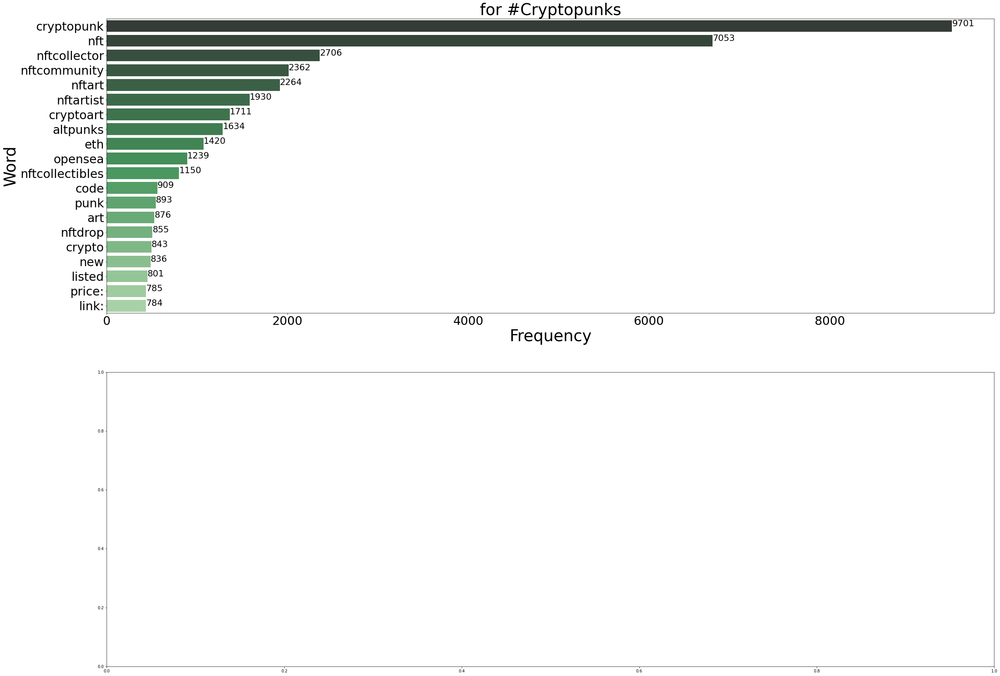

In [ ]:
fig, axs = plt.subplots(2,figsize=(40,30))
axs[0].set_title('for #Cryptopunks',fontsize=40)

pal1 = sns.color_palette("Greens_d", len(df1["Frequency"]))
rank1 = df1["Frequency"].argsort().argsort()
ax1=sns.barplot(data =df1, x = "Frequency", y = "Word", palette=np.array(pal1[::1])[rank1], ax=axs[0])

for index, row in df1.iterrows():
  ax1.text(row.Frequency,row.level_0,int(row.Frequency)+350, color='black', ha="left",fontsize=22)


ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_xlabel("Frequency",fontsize=40)
ax1.set_ylabel("Word",fontsize=40)


plt.show()
fig.savefig("overall_rank.pdf")

#Word Cloud

In [ ]:
# Join the different processed titles together.
long_string = ','.join(list(df_cryp['paper_text_processed'].values))#.join(list(df['paper_text_processed'].values))

#nltk.download('stopwords')
stop_words = stopwords.words('english')
#stop_words.extend(['from', 'subject', 're', 'edu', 'use','https',"tco","i'm","-","de","amp","&amp;"])

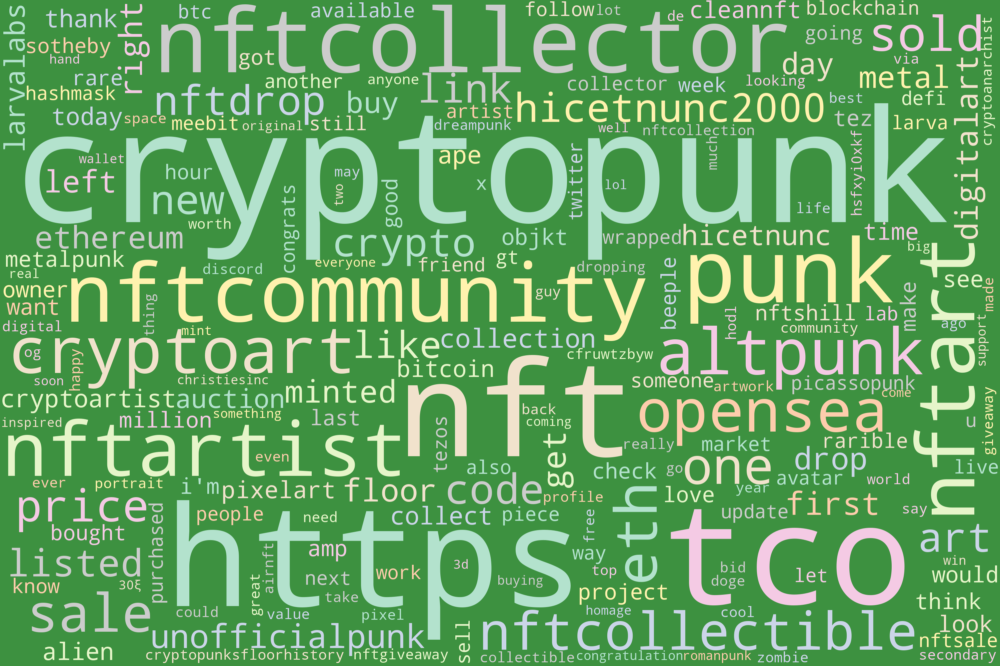

In [ ]:
#wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='#3D9140', colormap='Pastel2', collocations=False).generate(long_string)
wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='#3D9140', colormap='Pastel2', collocations=False, stopwords =stop_words).generate(long_string)

# Visualize the word cloud
wordcloud.to_image()

#LDA 

In [ ]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','https', "tco","-","de","amp","la","et","les","en","lo","un","el","que","por","es","se","los","para","ser","las","mas","una"])
def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]
data = df_cryp.paper_text_processed.values.tolist()
data_words = list(sent_to_words(data))
# remove stop words
data_words = remove_stopwords(data_words)
print(data_words[:1][0][:30])

['live', 'danverno', 'cryptopunk', 'come', 'story', 'nft', 'current', 'events', 'alpha', 'leaks', 'cant', 'miss', 'nft_snipers', 'chill', 'must', 'make', 'watch', 'youtube', 'yink', 'theta', 'zob', 'vfvxgh', 'nfts', 'ypl', 'wpeawp']


In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1)]


##topic=1

In [ ]:
def lda(corpus,id2word,num_topics):
  lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                        id2word=id2word,
                                        num_topics=num_topics, random_state=100)
  # Print the Keyword 
  pprint(lda_model.print_topics())
  doc_lda = lda_model[corpus]
  
  # Compute Coherence Score
  coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  print('\nCoherence Score: ', coherence_lda)

  return doc_lda

In [ ]:
lda(corpus, id2word, 1)

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.050*"cryptopunk" + 0.023*"nft" + 0.015*"nfts" + 0.013*"cryptopunks" + '
  '0.010*"eth" + 0.009*"punk" + 0.009*"nftart" + 0.009*"nftcommunity" + '
  '0.008*"cryptoart" + 0.008*"nftartist"')]


/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in


Coherence Score:  0.6211368354537574


##topic=5

In [ ]:
# number of topics
num_topics = 5
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=0)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.045*"cryptopunk" + 0.021*"nft" + 0.015*"eth" + 0.010*"punk" + '
  '0.009*"cryptopunks" + 0.009*"nfts" + 0.007*"nftart" + 0.007*"crypto" + '
  '0.006*"larvalabs" + 0.006*"cryptoart"'),
 (1,
  '0.044*"cryptopunk" + 0.020*"nft" + 0.019*"nfts" + 0.014*"nftartist" + '
  '0.012*"nftart" + 0.012*"nftcommunity" + 0.011*"eth" + 0.009*"cryptopunks" + '
  '0.009*"altpunks" + 0.008*"opensea"'),
 (2,
  '0.046*"cryptopunk" + 0.014*"nft" + 0.011*"eth" + 0.011*"nfts" + 0.008*"one" '
  '+ 0.008*"punk" + 0.006*"like" + 0.006*"nftart" + 0.006*"sale" + '
  '0.006*"nftcommunity"'),
 (3,
  '0.055*"cryptopunk" + 0.028*"nft" + 0.021*"cryptopunks" + 0.012*"nfts" + '
  '0.012*"opensea" + 0.008*"cryptoart" + 0.008*"floor" + 0.008*"nftcommunity" '
  '+ 0.008*"eth" + 0.007*"sold"'),
 (4,
  '0.054*"cryptopunk" + 0.028*"nft" + 0.022*"nfts" + 0.017*"punk" + '
  '0.015*"nftart" + 0.014*"nftcommunity" + 0.013*"cryptopunks" + '
  '0.013*"cryptoart" + 0.013*"nftcollector" + 0.010*"nftartist"')]


In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5422047632360649


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.030063 -0.045626       1        1  35.278884
3     -0.060343 -0.049188       2        1  24.152684
1      0.056661  0.003700       3        1  15.884843
0     -0.037918  0.057775       4        1  13.757957
2      0.011537  0.033339       5        1  10.925631, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  6457.000000  6457.000000  Default  30.0000  30.0000
51             eth  1145.000000  1145.000000  Default  29.0000  29.0000
489      hicetnunc   557.000000   557.000000  Default  28.0000  28.0000
333      nftartist  1044.000000  1044.000000  Default  27.0000  27.0000
173          floor   352.000000   352.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
150           sold    45.685692   607.463492   Topic5  -5.7224  -0.3734
337   nftcollector    50.764303   930.401719   Topic5  -5.6170  -0.6944
135          punks    38.310018   436.131714   Topic5  -5.8984  -0.2182
149    cryptopunks    40.167302  1644.663337   Topic5  -5.8511  -1.4982
43   nftcollectors    33.463478   735.795040   Topic5  -6.0337  -0.8764

[426 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
7479       3  0.698648     aaveaave
18957      5  0.932894  adamlevitan
19937      2  0.801746    addicting
6408       2  0.839854      adopter
16171      1  0.145489        adrop
...      ...       ...          ...
18761      2  0.084497      zignaly
18761      3  0.211242      zignaly
18761      4  0.675973      zignaly
12322      1  0.930067       zvkqgs
20982      4  0.900786         있습니다

[826 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 2, 1, 3])

##topic=10

In [ ]:
from pprint import pprint

# number of topics
num_topics =10
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=0)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.049*"cryptopunk" + 0.025*"nft" + 0.015*"punk" + 0.013*"eth" + '
  '0.011*"cryptopunks" + 0.011*"nfts" + 0.011*"nftart" + 0.010*"crypto" + '
  '0.008*"cryptoart" + 0.008*"nftcommunity"'),
 (1,
  '0.047*"cryptopunk" + 0.025*"nft" + 0.023*"nfts" + 0.017*"nftartist" + '
  '0.015*"nftart" + 0.014*"nftcommunity" + 0.011*"altpunks" + '
  '0.011*"cryptopunks" + 0.010*"opensea" + 0.009*"eth"'),
 (2,
  '0.047*"cryptopunk" + 0.016*"nft" + 0.013*"nfts" + 0.011*"one" + 0.011*"eth" '
  '+ 0.011*"punk" + 0.008*"nftart" + 0.007*"nftcommunity" + 0.007*"like" + '
  '0.007*"cryptoart"'),
 (3,
  '0.055*"cryptopunk" + 0.031*"nft" + 0.027*"cryptopunks" + 0.014*"nfts" + '
  '0.014*"opensea" + 0.012*"floor" + 0.010*"cryptoart" + 0.009*"eth" + '
  '0.009*"punks" + 0.009*"nftcommunity"'),
 (4,
  '0.054*"cryptopunk" + 0.031*"nft" + 0.024*"nfts" + 0.021*"punk" + '
  '0.017*"nftart" + 0.016*"nftcommunity" + 0.016*"cryptopunks" + '
  '0.015*"cryptoart" + 0.015*"nftcollector" + 0.013*"hicetnunc"'),
 (5,
  

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.48640019309074267


In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [ ]:
lda_viz


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.088482 -0.018304       1        1  26.420385
3      0.049632  0.039718       2        1  15.893794
1      0.050734 -0.052439       3        1  11.243330
5     -0.056276  0.106842       4        1  10.027209
6      0.026001  0.000797       5        1   9.944519
0      0.026033  0.022830       6        1   8.811472
2      0.028542  0.004908       7        1   6.836101
9      0.006500 -0.034866       8        1   5.160357
7     -0.098439 -0.027636       9        1   3.105061
8     -0.121208 -0.041848      10        1   2.557771, topic_info=           Term         Freq        Total Category  logprob  loglift
4    cryptopunk  6524.000000  6524.000000  Default  30.0000  30.0000
13          nft  3116.000000  3116.000000  Default  29.0000  29.0000
51          eth  1172.000000  1172.000000  Default  28.0000  28.0000
489   hicetnunc   573.000000   573.000000  Default  27.0000  27.0000
333   nftartist  1069.000000  1069.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
52        going     6.365349   145.213495  Topic10  -6.2413   0.5387
135       punks     7.341585   447.174678  Topic10  -6.0986  -0.4434
13          nft     9.226639  3116.985795  Topic10  -5.8701  -2.1565
173       floor     6.545039   357.670440  Topic10  -6.2135  -0.3349
333   nftartist     6.499433  1069.059652  Topic10  -6.2205  -1.4368

[818 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
21690      3  0.855247           aan
18914     10  0.447964           abt
17555      2  0.878013  accidentally
19937      2  0.241318     addicting
19937      9  0.723954     addicting
...      ...       ...           ...
7377       1  0.824897            zy
20654      8  0.754225          zzju
19176      2  0.802051            ال
19188      2  0.802051         شراها
19195      2  0.802051           هذه

[2128 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 2, 6, 7, 1, 3, 10, 8, 9])

##topic=15

In [ ]:
from pprint import pprint

# number of topics
num_topics =15
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.049*"cryptopunk" + 0.029*"nft" + 0.014*"nfts" + 0.010*"cryptopunks" + '
  '0.008*"eth" + 0.008*"cryptoart" + 0.008*"nftart" + 0.007*"sale" + '
  '0.007*"punk" + 0.007*"opensea"'),
 (1,
  '0.054*"cryptopunk" + 0.013*"nft" + 0.011*"eth" + 0.007*"like" + '
  '0.007*"cryptopunks" + 0.007*"cryptoart" + 0.006*"nfts" + 0.006*"get" + '
  '0.005*"punk" + 0.005*"first"'),
 (2,
  '0.046*"cryptopunk" + 0.022*"nft" + 0.013*"nfts" + 0.012*"eth" + '
  '0.012*"sold" + 0.009*"cryptoart" + 0.009*"cryptopunks" + '
  '0.009*"nftcommunity" + 0.009*"nftart" + 0.007*"nftcollector"'),
 (3,
  '0.063*"cryptopunk" + 0.023*"nft" + 0.010*"cryptopunks" + 0.009*"punk" + '
  '0.009*"nfts" + 0.007*"one" + 0.007*"cryptoart" + 0.005*"first" + '
  '0.005*"nftcollector" + 0.005*"nftart"'),
 (4,
  '0.049*"cryptopunk" + 0.036*"nft" + 0.030*"cryptopunks" + 0.026*"nfts" + '
  '0.019*"nftart" + 0.019*"nftcommunity" + 0.018*"punk" + 0.017*"nftartist" + '
  '0.016*"nftcollector" + 0.015*"cryptoart"'),
 (5,
  '0.034*"cr

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5160509952657841


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.138984 -0.041198       1        1  20.189464
12     0.061060 -0.012574       2        1  10.074882
9      0.066017  0.020160       3        1   9.729726
7      0.047151 -0.026869       4        1   8.808034
3     -0.017987  0.065210       5        1   7.757329
8      0.023542  0.014289       6        1   7.497349
2      0.004337  0.029580       7        1   6.350441
1     -0.047720  0.054545       8        1   4.827756
0     -0.002573 -0.011997       9        1   4.779672
10    -0.037657  0.076178      10        1   4.694525
6     -0.019614 -0.002404      11        1   4.159911
14    -0.019140 -0.020893      12        1   3.938960
11    -0.060468 -0.006947      13        1   2.883452
13    -0.027976 -0.038600      14        1   2.567318
5     -0.107956 -0.098480      15        1   1.741181, topic_info=            Term         Freq        Total Category  logprob  loglift
4     cryptopunk  6421.000000  6421.000000  Default  30.0000  30.0000
489    hicetnunc   558.000000   558.000000  Default  29.0000  29.0000
487         code   383.000000   383.000000  Default  28.0000  28.0000
13           nft  3190.000000  3190.000000  Default  27.0000  27.0000
178      opensea   996.000000   996.000000  Default  26.0000  26.0000
..           ...          ...          ...      ...      ...      ...
149  cryptopunks     5.984442  1805.430707  Topic15  -5.9184  -1.6588
51           eth     5.715226  1283.286420  Topic15  -5.9645  -1.3634
150         sold     5.110914   594.227471  Topic15  -6.0762  -0.7053
178      opensea     5.343519   996.242574  Topic15  -6.0317  -1.1775
135        punks     4.654129   503.816215  Topic15  -6.1699  -0.6339

[1210 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
18792      7  0.692799        aatyju
18806      6  0.670373        abysms
20169      9  0.714463          acid
9199       8  0.640517  acquisitions
1586       1  0.121616           add
...      ...       ...           ...
20983      7  0.692799            자기
20984      7  0.692799           자신을
20985      7  0.692799           정신을
20988      7  0.692799         차산업혁명
20989      7  0.692799           초연결

[3451 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 8, 4, 9, 3, 2, 1, 11, 7, 15, 12, 14, 6])

##topic=20

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.050*"cryptopunk" + 0.037*"nft" + 0.020*"nfts" + 0.014*"nftart" + '
  '0.011*"nftcommunity" + 0.011*"sale" + 0.011*"cryptopunks" + '
  '0.010*"nftartist" + 0.010*"punk" + 0.009*"cryptoart"'),
 (1,
  '0.056*"cryptopunk" + 0.014*"nft" + 0.012*"eth" + 0.009*"nfts" + '
  '0.008*"cryptopunks" + 0.007*"get" + 0.007*"nftart" + 0.006*"punk" + '
  '0.006*"cryptoart" + 0.006*"first"'),
 (2,
  '0.047*"cryptopunk" + 0.027*"nft" + 0.018*"nfts" + 0.015*"sold" + '
  '0.015*"nftcommunity" + 0.013*"nftart" + 0.012*"cryptopunks" + '
  '0.011*"nftcollector" + 0.010*"eth" + 0.010*"cryptoart"'),
 (3,
  '0.061*"cryptopunk" + 0.024*"nft" + 0.011*"nfts" + 0.010*"cryptopunks" + '
  '0.009*"punk" + 0.007*"cryptoart" + 0.007*"nftcollector" + 0.007*"nftart" + '
  '0.006*"nftcommunity" + 0.005*"buy"'),
 (4,
  '0.049*"cryptopunk" + 0.038*"nft" + 0.031*"nfts" + 0.030*"cryptopunks" + '
  '0.024*"nftcommunity" + 0.024*"nftart" + 0.023*"punk" + 0.020*"nftartist" + '
  '0.018*"nftcollector" + 0.017*"hicetnunc"'

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5366616417103456


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.138861  0.012022       1        1  15.624177
12     0.086754 -0.031318       2        1   8.586627
9      0.062258  0.087298       3        1   8.341104
7      0.065928 -0.042857       4        1   7.191861
19     0.066128 -0.024799       5        1   6.420642
3     -0.024732  0.041287       6        1   5.799975
8      0.021465  0.011078       7        1   5.626523
18    -0.005291  0.072775       8        1   4.964801
2      0.025434 -0.003597       9        1   4.862470
1     -0.039809  0.030771      10        1   4.380650
0      0.019318 -0.023366      11        1   4.144993
10    -0.034419 -0.012098      12        1   3.583288
6     -0.025528  0.001734      13        1   3.430143
14    -0.004855  0.022370      14        1   3.253902
15    -0.094327  0.035363      15        1   2.916090
16    -0.125723  0.022027      16        1   2.622017
13     0.000915 -0.051969      17        1   2.375854
11    -0.027663 -0.049079      18        1   2.258180
17    -0.020808 -0.010256      19        1   2.198723
5     -0.083906 -0.087386      20        1   1.417979, topic_info=                Term         Freq        Total Category  logprob  loglift
4         cryptopunk  6436.000000  6436.000000  Default  30.0000  30.0000
489        hicetnunc   738.000000   738.000000  Default  29.0000  29.0000
487             code   498.000000   498.000000  Default  28.0000  28.0000
13               nft  3431.000000  3431.000000  Default  27.0000  27.0000
150             sold   645.000000   645.000000  Default  26.0000  26.0000
..               ...          ...          ...      ...      ...      ...
43     nftcollectors     5.920133   976.994060  Topic20  -5.7239  -0.8502
805             time     4.181083   181.621175  Topic20  -6.0717   0.4846
51               eth     5.303643  1059.065683  Topic20  -5.8339  -1.0408
336  nftcollectibles     5.042230   764.377225  Topic20  -5.8844  -0.7653
149      cryptopunks     4.826385  1913.174991  Topic20  -5.9282  -1.7265

[1689 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
10878      4  0.703523           abc
8626      14  0.629406         abhzd
13050      5  0.745311       abraham
17555     19  0.451343  accidentally
10433     10  0.809132          acct
...      ...       ...           ...
5804       2  0.718195            رو
19188     12  0.416361         شراها
11194     11  0.640684  回目のnftオークション
20982     18  0.450736          있습니다
3298       2  0.555705           𝗕𝗶𝗴

[5401 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 8, 20, 4, 9, 19, 3, 2, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

##Topic=25

In [ ]:
from pprint import pprint

# number of topics
num_topics =25
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(12,
  '0.047*"cryptopunk" + 0.032*"nft" + 0.022*"nfts" + 0.020*"cryptopunks" + '
  '0.018*"nftcommunity" + 0.017*"punk" + 0.015*"nftart" + 0.015*"nftartist" + '
  '0.014*"altpunks" + 0.012*"sale"'),
 (7,
  '0.048*"cryptopunk" + 0.023*"nft" + 0.020*"nfts" + 0.016*"nftart" + '
  '0.015*"eth" + 0.014*"nftcommunity" + 0.012*"nftcollectors" + '
  '0.012*"nftartist" + 0.011*"cryptopunks" + 0.010*"opensea"'),
 (16,
  '0.048*"cryptopunk" + 0.028*"nft" + 0.009*"art" + 0.005*"cryptopunks" + '
  '0.005*"alien" + 0.005*"portraits" + 0.005*"fine" + 0.005*"cryptoart" + '
  '0.004*"nfts" + 0.004*"punk"'),
 (15,
  '0.057*"cryptopunk" + 0.015*"eth" + 0.009*"nfts" + 0.009*"nft" + '
  '0.008*"sold" + 0.008*"cryptopunks" + 0.007*"floor" + 0.007*"larvalabs" + '
  '0.006*"punks" + 0.004*"ethereum"'),
 (10,
  '0.048*"cryptopunk" + 0.023*"nft" + 0.015*"eth" + 0.013*"cryptopunks" + '
  '0.012*"nfts" + 0.012*"sold" + 0.009*"punk" + 0.008*"art" + 0.008*"crypto" + '
  '0.007*"ethereum"'),
 (11,
  '0.043*"crypto

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.496008769698063


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.146185  0.018485       1        1  13.196589
12     0.086035  0.045698       2        1   7.896196
9      0.056859 -0.061106       3        1   6.988569
19     0.083585  0.028879       4        1   6.054956
21     0.033926 -0.016275       5        1   5.920023
7      0.056664 -0.008191       6        1   5.075159
8      0.028280 -0.020497       7        1   4.861513
3     -0.009736 -0.045842       8        1   4.570464
20     0.032571  0.007282       9        1   4.320516
18    -0.005343 -0.084072      10        1   3.907097
23     0.041416  0.012736      11        1   3.898813
2      0.021448 -0.009060      12        1   3.821389
10    -0.028491  0.002430      13        1   3.163267
1     -0.038163 -0.056424      14        1   3.101141
0     -0.000984  0.039218      15        1   2.949722
22    -0.038240 -0.057258      16        1   2.902636
6     -0.002366 -0.025238      17        1   2.848581
14    -0.025137 -0.032424      18        1   2.337124
15    -0.087727 -0.010195      19        1   2.299799
16    -0.110742 -0.028484      20        1   1.934122
13    -0.001860  0.072987      21        1   1.870540
11    -0.050147  0.061669      22        1   1.795967
24    -0.040863  0.047197      23        1   1.528215
17    -0.056824  0.037585      24        1   1.401748
5     -0.090347  0.080901      25        1   1.355854, topic_info=                Term         Freq        Total Category  logprob  loglift
4         cryptopunk  6413.000000  6413.000000  Default  30.0000  30.0000
489        hicetnunc   563.000000   563.000000  Default  29.0000  29.0000
13               nft  3167.000000  3167.000000  Default  28.0000  28.0000
51               eth  1267.000000  1267.000000  Default  27.0000  27.0000
487             code   384.000000   384.000000  Default  26.0000  26.0000
..               ...          ...          ...      ...      ...      ...
44      nftcommunity     6.043738  1343.397496  Topic25  -5.6585  -1.1032
178          opensea     5.725249   992.057430  Topic25  -5.7126  -0.8542
332           nftart     5.238684  1317.151157  Topic25  -5.8014  -1.2264
288              one     4.149312   711.670640  Topic25  -6.0345  -0.8439
816  unofficialpunks     4.028153   331.792707  Topic25  -6.0642  -0.1105

[1888 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
18792     12  0.691269       aatyju
18806      7  0.634413       abysms
7540      25  0.588046   accessible
1063       1  0.021521     actually
1063       2  0.150644     actually
...      ...       ...          ...
19169     20  0.754758   誰か買ったんやwww
18863      2  0.731539  适合有投资经验的投资者
20967     12  0.691269          기술의
20982     12  0.807390         있습니다
19623     19  0.791728         𝙅𝙐𝙍𝙔

[6071 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 20, 22, 8, 9, 4, 21, 19, 24, 3, 11, 2, 1, 23, 7, 15, 16, 17, 14, 12, 25, 18, 6])

##Topic=30

In [ ]:
from pprint import pprint

# number of topics
num_topics =30
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(27,
  '0.052*"cryptopunk" + 0.027*"nft" + 0.018*"opensea" + 0.016*"nftart" + '
  '0.015*"nfts" + 0.015*"punk" + 0.014*"cryptopunks" + 0.013*"nftartist" + '
  '0.013*"cryptoart" + 0.012*"nftcommunity"'),
 (11,
  '0.043*"cryptopunk" + 0.013*"nft" + 0.008*"nfts" + 0.007*"nftart" + '
  '0.006*"punk" + 0.006*"new" + 0.005*"cryptopunks" + 0.005*"million" + '
  '0.005*"htmlcoin" + 0.005*"beeple"'),
 (21,
  '0.054*"cryptopunk" + 0.022*"nft" + 0.018*"nfts" + 0.015*"nftcommunity" + '
  '0.015*"nftart" + 0.014*"nftartist" + 0.013*"cryptopunks" + 0.012*"altpunks" '
  '+ 0.010*"sold" + 0.009*"nftcollectors"'),
 (2,
  '0.047*"cryptopunk" + 0.023*"nft" + 0.016*"sold" + 0.016*"eth" + '
  '0.014*"nfts" + 0.010*"cryptopunks" + 0.008*"nftart" + 0.008*"nftcommunity" '
  '+ 0.007*"cryptoart" + 0.007*"one"'),
 (6,
  '0.048*"cryptopunk" + 0.012*"nft" + 0.011*"eth" + 0.011*"opensea" + '
  '0.009*"nfts" + 0.008*"art" + 0.007*"like" + 0.006*"nftcommunity" + '
  '0.006*"get" + 0.005*"nftart"'),
 (16,
  '0.047*

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4875890461699264


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.146747 -0.041559       1        1  12.393582
12     0.080161 -0.014490       2        1   7.017958
9      0.070567  0.005222       3        1   5.226524
21     0.055181  0.014329       4        1   5.061146
7      0.060044 -0.025153       5        1   4.771451
19     0.072786 -0.061788       6        1   4.644009
27     0.049489 -0.029679       7        1   4.259636
8      0.041499  0.017541       8        1   3.962842
28     0.014252  0.023562       9        1   3.675974
3     -0.007992  0.069184      10        1   3.674751
18     0.015637  0.039776      11        1   3.546370
2      0.039624  0.038810      12        1   3.479014
23     0.035320 -0.000297      13        1   3.421213
0      0.012385  0.017568      14        1   3.027337
25     0.014554  0.002284      15        1   2.952849
22    -0.029098  0.062844      16        1   2.799365
1     -0.015526  0.062007      17        1   2.789601
14     0.001213 -0.013506      18        1   2.730984
10    -0.034963  0.051386      19        1   2.684034
20     0.018353  0.001194      20        1   2.669967
6     -0.023375  0.004756      21        1   2.110309
15    -0.040940  0.009356      22        1   2.050345
29    -0.101521  0.078755      23        1   1.927244
24    -0.029028 -0.000142      24        1   1.708192
17    -0.000966 -0.084255      25        1   1.599786
11    -0.059424 -0.005249      26        1   1.496436
13     0.010721 -0.059324      27        1   1.491748
16    -0.111762  0.019846      28        1   1.401091
5     -0.106986 -0.088380      29        1   0.792698
26    -0.176954 -0.094598      30        1   0.633543, topic_info=            Term         Freq        Total Category  logprob  loglift
4     cryptopunk  6399.000000  6399.000000  Default  30.0000  30.0000
489    hicetnunc   571.000000   571.000000  Default  29.0000  29.0000
487         code   394.000000   394.000000  Default  28.0000  28.0000
51           eth  1257.000000  1257.000000  Default  27.0000  27.0000
13           nft  3176.000000  3176.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
1387        much     1.714069    89.954769  Topic30  -6.1577   1.1012
3508    cheapest     1.652659    55.063479  Topic30  -6.1942   1.5555
1144         got     1.680012   184.307058  Topic30  -6.1778   0.3638
150         sold     1.713778   588.969748  Topic30  -6.1579  -0.7781
222      someone     1.625178   157.553419  Topic30  -6.2110   0.4874

[2189 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
19729      4  0.904537         aaak
21838     30  0.456320     aantonop
18914      9  0.657764          abt
20235     16  0.733625          abu
18806     12  0.716527       abysms
...      ...       ...          ...
21025     14  0.669546      認識しやすい物
19213     13  0.710353   誰も注目してないけと
18863     27  0.452424  适合有投资经验的投资者
20982     12  0.235813         있습니다
20982     26  0.707440         있습니다

[7163 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 22, 8, 20, 28, 9, 29, 4, 19, 3, 24, 1, 26, 23, 2, 15, 11, 21, 7, 16, 30, 25, 18, 12, 14, 17, 6, 27])

##Topic=35

In [ ]:
from pprint import pprint

# number of topics
num_topics =35
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(32,
  '0.046*"cryptopunk" + 0.030*"nft" + 0.015*"cryptoart" + 0.015*"nfts" + '
  '0.014*"nftart" + 0.012*"eth" + 0.011*"cryptopunks" + 0.011*"nftartist" + '
  '0.010*"nftcommunity" + 0.009*"opensea"'),
 (14,
  '0.044*"cryptopunk" + 0.015*"nft" + 0.012*"nfts" + 0.010*"cryptoart" + '
  '0.008*"cryptopunks" + 0.008*"punk" + 0.008*"art" + 0.008*"hicetnunc" + '
  '0.007*"one" + 0.007*"nftcollector"'),
 (21,
  '0.053*"cryptopunk" + 0.022*"nft" + 0.018*"nfts" + 0.015*"nftart" + '
  '0.015*"nftcommunity" + 0.014*"nftartist" + 0.014*"cryptopunks" + '
  '0.013*"sold" + 0.011*"altpunks" + 0.010*"nftcollectors"'),
 (22,
  '0.054*"cryptopunk" + 0.026*"nft" + 0.010*"nfts" + 0.009*"nftcommunity" + '
  '0.009*"cryptoart" + 0.008*"nftart" + 0.008*"got" + 0.006*"nftcollector" + '
  '0.005*"eth" + 0.005*"cryptopunks"'),
 (12,
  '0.048*"cryptopunk" + 0.039*"nft" + 0.025*"nfts" + 0.022*"cryptopunks" + '
  '0.020*"nftcommunity" + 0.017*"nftartist" + 0.017*"nftart" + 0.017*"punk" + '
  '0.014*"altpunks" + 

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4987046593645789


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4      0.140862 -0.067463       1        1  9.816069
9      0.074778  0.056110       2        1  7.346573
12     0.101487 -0.045941       3        1  6.614418
7      0.068225  0.018587       4        1  4.069431
21     0.041546  0.007113       5        1  4.020680
19     0.066515 -0.024233       6        1  3.912685
32     0.048035  0.006130       7        1  3.369218
23     0.056237 -0.002269       8        1  3.285289
8      0.052050 -0.022820       9        1  3.245978
28     0.016930  0.031120      10        1  3.183639
30     0.011543  0.012728      11        1  3.151096
27     0.035648 -0.012117      12        1  3.150890
2      0.014269  0.038280      13        1  3.002933
3     -0.011154  0.036894      14        1  2.927517
20     0.022760  0.004812      15        1  2.788539
0      0.013477 -0.032232      16        1  2.662832
33     0.024373  0.030426      17        1  2.629785
1     -0.012314  0.033140      18        1  2.590265
18     0.010995  0.061943      19        1  2.540644
25     0.009164  0.030825      20        1  2.297292
10    -0.029258  0.046135      21        1  2.206884
22    -0.037056  0.020061      22        1  1.920299
31     0.009308 -0.002769      23        1  1.883936
34    -0.069783  0.006405      24        1  1.785019
6      0.003695  0.026832      25        1  1.780732
24    -0.019780  0.009460      26        1  1.746328
14    -0.014628  0.038476      27        1  1.723303
29    -0.138683  0.055666      28        1  1.536474
11    -0.026906 -0.008435      29        1  1.518342
15    -0.068332 -0.093578      30        1  1.503848
17    -0.013933 -0.084853      31        1  1.464910
16    -0.110599  0.034707      32        1  1.394914
13    -0.013111 -0.073433      33        1  1.384984
5     -0.110765 -0.116536      34        1  0.816835
26    -0.145593 -0.019170      35        1  0.727419, topic_info=           Term         Freq        Total Category  logprob  loglift
4    cryptopunk  6396.000000  6396.000000  Default  30.0000  30.0000
173       floor   424.000000   424.000000  Default  29.0000  29.0000
51          eth  1268.000000  1268.000000  Default  28.0000  28.0000
489   hicetnunc   593.000000   593.000000  Default  27.0000  27.0000
13          nft  3190.000000  3190.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
101        away     2.020379    40.971673  Topic35  -6.1315   1.9138
39    cryptoart     2.584957  1128.075315  Topic35  -5.8851  -1.1551
375  collection     2.275934   199.422358  Topic35  -6.0124   0.4504
135       punks     2.298671   481.765035  Topic35  -6.0025  -0.4217
332      nftart     2.232802  1320.966284  Topic35  -6.0315  -1.4594

[2519 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
7479       4  0.695744    aaveaave
18914     10  0.727217         abt
20339      6  0.775157   accepting
21507     34  0.747765  adamdraper
19937     21  0.901674   addicting
...      ...       ...         ...
20970     13  0.677792        분권화를
20973     13  0.677792        상황에서
20982     13  0.790078        있습니다
20986     13  0.677792      중앙화된다면
19623     20  0.759601        𝙅𝙐𝙍𝙔

[8378 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 13, 8, 22, 20, 33, 24, 9, 29, 31, 28, 3, 4, 21, 1, 34, 2, 19, 26, 11, 23, 32, 35, 7, 25, 15, 30, 12, 16, 18, 17, 14, 6, 27])

##Topic=40

In [ ]:
from pprint import pprint

# number of topics
num_topics =40
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(39,
  '0.057*"cryptopunk" + 0.015*"nft" + 0.014*"eth" + 0.012*"nfts" + '
  '0.010*"cryptopunks" + 0.008*"punk" + 0.007*"sold" + 0.007*"nftcommunity" + '
  '0.006*"like" + 0.006*"one"'),
 (26,
  '0.024*"cryptopunk" + 0.010*"moon" + 0.009*"like" + 0.007*"nft" + '
  '0.006*"someone" + 0.005*"time" + 0.005*"pic" + 0.005*"profile" + '
  '0.005*"looks" + 0.004*"sold"'),
 (37,
  '0.050*"cryptopunk" + 0.039*"nft" + 0.022*"nfts" + 0.016*"nftart" + '
  '0.015*"eth" + 0.015*"punk" + 0.014*"nftcommunity" + 0.013*"cryptoart" + '
  '0.013*"nftartist" + 0.012*"altpunks"'),
 (22,
  '0.057*"cryptopunk" + 0.017*"nft" + 0.010*"cryptoart" + 0.009*"nfts" + '
  '0.007*"nftart" + 0.006*"cryptopunks" + 0.006*"crypto" + '
  '0.006*"nftcommunity" + 0.005*"got" + 0.005*"art"'),
 (32,
  '0.043*"cryptopunk" + 0.033*"nft" + 0.016*"cryptoart" + 0.016*"nfts" + '
  '0.016*"nftart" + 0.015*"cryptopunks" + 0.014*"eth" + 0.014*"nftcommunity" + '
  '0.012*"nftcollector" + 0.012*"nftartist"'),
 (6,
  '0.045*"cryptopunk" 

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.47366583277307794


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
38     0.161277  0.058317       1        1  14.547574
4      0.137561 -0.049683       2        1   6.631485
37     0.079741  0.011618       3        1   4.302954
12     0.070692 -0.053508       4        1   4.264838
35     0.104122  0.049437       5        1   3.499328
32     0.053463  0.043287       6        1   3.079170
21     0.038345 -0.000513       7        1   2.858605
19     0.055829  0.002854       8        1   2.853615
27     0.034459  0.028183       9        1   2.742337
39    -0.004011 -0.056900      10        1   2.664344
7      0.036452  0.032052      11        1   2.442023
9      0.057498  0.041838      12        1   2.415754
18    -0.005861  0.003895      13        1   2.384493
30    -0.020308 -0.035358      14        1   2.338570
28     0.010850 -0.009730      15        1   2.299858
25     0.010958 -0.005803      16        1   2.273420
3      0.001193 -0.103552      17        1   2.206189
20     0.020370 -0.021543      18        1   2.197246
2      0.014789  0.001715      19        1   2.189239
33     0.026178  0.027474      20        1   2.113436
23     0.035467  0.037419      21        1   2.073060
8      0.026188 -0.028658      22        1   2.044908
10    -0.033191 -0.012450      23        1   1.946215
36     0.008306 -0.030372      24        1   1.921050
0      0.005117 -0.017039      25        1   1.899249
1     -0.007142 -0.014829      26        1   1.892712
14    -0.015702  0.010232      27        1   1.877670
31     0.017050  0.017222      28        1   1.790243
22    -0.040214  0.038526      29        1   1.598396
15    -0.056409 -0.147972      30        1   1.462012
34    -0.088820  0.007124      31        1   1.455961
29    -0.094453  0.024417      32        1   1.398938
6     -0.046845 -0.014096      33        1   1.378318
11    -0.051881  0.034521      34        1   1.304170
13    -0.024652 -0.013705      35        1   1.256424
24    -0.052156  0.021659      36        1   1.131633
16    -0.114663  0.022159      37        1   1.079163
17    -0.044093  0.027656      38        1   0.967614
5     -0.126431  0.026730      39        1   0.788801
26    -0.179071  0.047375      40        1   0.428985, topic_info=           Term         Freq        Total Category  logprob  loglift
4    cryptopunk  6351.000000  6351.000000  Default  30.0000  30.0000
489   hicetnunc   727.000000   727.000000  Default  29.0000  29.0000
487        code   512.000000   512.000000  Default  28.0000  28.0000
13          nft  3292.000000  3292.000000  Default  27.0000  27.0000
51          eth  1203.000000  1203.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
30          get     1.368798   337.623799  Topic40  -5.9928  -0.0565
89       crypto     1.368798   521.042602  Topic40  -5.9928  -0.4904
254      traded     1.368798    36.645782  Topic40  -5.9928   2.1641
435       great     1.368798    96.014840  Topic40  -5.9928   1.2009
568        take     1.368798    89.906251  Topic40  -5.9928   1.2667

[2857 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
19729     19  0.765365        aaak
20706     38  0.837066  aarlnszsmd
18792     19  0.765365      aatyju
18914     28  0.753405         abt
20339      8  0.640468   accepting
...      ...       ...         ...
20970     19  0.765365        분권화를
20977     19  0.765365         어느새
20979     19  0.765365         우리도
20982     19  0.907069        있습니다
19623     26  0.780115        𝙅𝙐𝙍𝙔

[9590 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[39, 5, 38, 13, 36, 33, 22, 20, 28, 40, 8, 10, 19, 31, 29, 26, 4, 21, 3, 34, 24, 9, 11, 37, 1, 2, 15, 32, 23, 16, 35, 30, 7, 12, 14, 25, 17, 18, 6, 27])

##Coherence Graph

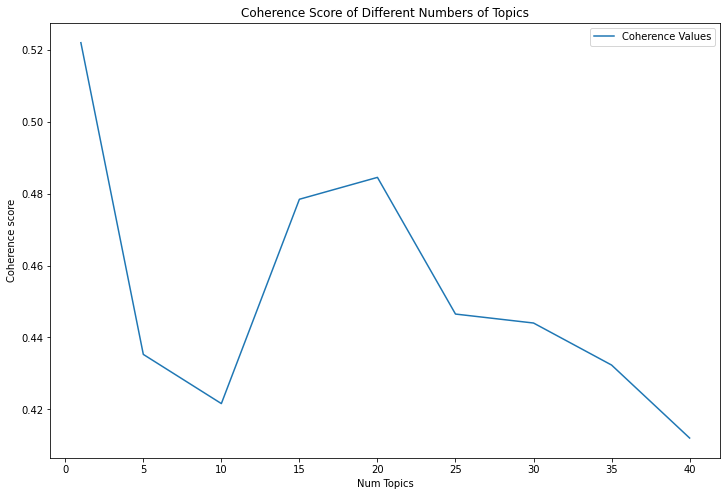

In [ ]:
x=[1,5,10,15,20,25,30,35,40]
coherence_values=[ 0.5220695862935927,0.43527452633708047,0.42158196900864836,0.4784741781296445,0.484565379511168
,  0.44650946602739805, 0.4440136991286358,0.4323130004959125,0.41199035852715127]

plt.figure(figsize=(12,8))
plt.plot(x, coherence_values, label="Coherence Values")
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend()
plt.title("Coherence Score of Different Numbers of Topics")
plt.show()

##Determine Parameters alpha and beta

###alpha=0.01,beta=0.91

In [ ]:
# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.01,eta=0.91)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.013*"cryptopunk" + 0.008*"nft" + 0.004*"nfts" + 0.003*"nftart" + '
  '0.002*"cryptopunks" + 0.002*"cryptoart" + 0.002*"sale" + '
  '0.002*"nftcommunity" + 0.002*"nftartist" + 0.002*"punk"'),
 (1,
  '0.016*"cryptopunk" + 0.004*"eth" + 0.004*"nft" + 0.002*"get" + 0.002*"nfts" '
  '+ 0.002*"cryptopunks" + 0.002*"punk" + 0.002*"like" + 0.002*"cryptoart" + '
  '0.002*"price"'),
 (2,
  '0.013*"cryptopunk" + 0.006*"nft" + 0.004*"sold" + 0.004*"nfts" + '
  '0.004*"eth" + 0.003*"cryptopunks" + 0.003*"nftart" + 0.003*"nftcommunity" + '
  '0.003*"cryptoart" + 0.002*"nftcollector"'),
 (3,
  '0.019*"cryptopunk" + 0.007*"nft" + 0.003*"cryptopunks" + 0.003*"nfts" + '
  '0.002*"punk" + 0.002*"cryptoart" + 0.002*"buy" + 0.002*"nftcollector" + '
  '0.002*"nftart" + 0.002*"one"'),
 (4,
  '0.022*"cryptopunk" + 0.017*"nft" + 0.014*"cryptopunks" + 0.012*"nfts" + '
  '0.009*"nftart" + 0.009*"nftcommunity" + 0.009*"punk" + 0.008*"nftartist" + '
  '0.007*"nftcollector" + 0.006*"cryptoart"'),
 (5,
  '

In [ ]:
# Compute Coherence Score

coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.49454259552315366


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.065803  0.003601       1        1  41.634023
9     -0.020882 -0.024117       2        1   7.577427
3     -0.000749 -0.008702       3        1   6.262185
12    -0.019903  0.010481       4        1   5.709157
18     0.000460 -0.010441       5        1   4.733930
8     -0.005687  0.000651       6        1   4.048743
1      0.006322 -0.006747       7        1   4.031984
19    -0.013573  0.009834       8        1   3.983597
7     -0.009014  0.007636       9        1   3.817470
2     -0.002931  0.000293      10        1   3.233286
0      0.000186  0.004671      11        1   2.398145
10     0.008122  0.000104      12        1   2.205191
6      0.007376  0.000476      13        1   1.886027
14     0.007205 -0.000989      14        1   1.839387
15     0.018212 -0.002425      15        1   1.771556
16     0.024191 -0.003979      16        1   1.483380
13     0.007349  0.007243      17        1   1.169564
11     0.016728  0.003011      18        1   1.026402
17     0.013208  0.002870      19        1   0.793318
5      0.029183  0.006529      20        1   0.395227, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  2318.000000  2318.000000  Default  30.0000  30.0000
13             nft  1402.000000  1402.000000  Default  29.0000  29.0000
15            nfts   976.000000   976.000000  Default  28.0000  28.0000
51             eth   526.000000   526.000000  Default  27.0000  27.0000
44    nftcommunity   662.000000   662.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
135          punks     0.176979   277.615525  Topic20  -7.9565  -1.8245
60            punk     0.155455   674.667846  Topic20  -8.0861  -2.8422
43   nftcollectors     0.150208   319.381349  Topic20  -8.1205  -2.1287
149    cryptopunks     0.147379   991.236717  Topic20  -8.1395  -3.2802
977       nftshill     0.141008    79.206152  Topic20  -8.1837  -0.7975

[1459 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
20706      1  0.253657  aarlnszsmd
1307       1  0.285531        able
1307       2  0.095177        able
1307       4  0.190354        able
1307       5  0.095177        able
...      ...       ...         ...
19195      1  0.230070         هذه
18849      1  0.242993      コレクション
18850      1  0.242993      最終取引価格
20977      1  0.251768         어느새
20982      1  0.243202        있습니다

[4177 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 4, 13, 19, 9, 2, 20, 8, 3, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

###a=0.31, b=0.91

In [ ]:

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.31,eta=0.9)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.012*"cryptopunk" + 0.008*"nft" + 0.004*"nfts" + 0.002*"cryptopunks" + '
  '0.002*"sale" + 0.002*"nftart" + 0.002*"cryptoart" + 0.002*"punk" + '
  '0.002*"eth" + 0.002*"opensea"'),
 (1,
  '0.016*"cryptopunk" + 0.004*"eth" + 0.004*"nft" + 0.002*"get" + 0.002*"like" '
  '+ 0.002*"first" + 0.002*"cryptopunks" + 0.002*"cryptoart" + 0.002*"punk" + '
  '0.002*"price"'),
 (2,
  '0.013*"cryptopunk" + 0.006*"nft" + 0.005*"sold" + 0.004*"eth" + '
  '0.003*"nfts" + 0.003*"cryptoart" + 0.003*"nftart" + 0.002*"nftcommunity" + '
  '0.002*"today" + 0.002*"cryptopunks"'),
 (3,
  '0.022*"cryptopunk" + 0.008*"nft" + 0.003*"cryptopunks" + 0.003*"punk" + '
  '0.002*"nfts" + 0.002*"cryptoart" + 0.002*"one" + 0.002*"first" + '
  '0.002*"nftcollector" + 0.002*"ethereum"'),
 (4,
  '0.024*"cryptopunk" + 0.019*"nft" + 0.017*"cryptopunks" + 0.014*"nfts" + '
  '0.011*"nftart" + 0.010*"nftcommunity" + 0.009*"punk" + 0.009*"nftartist" + '
  '0.009*"nftcollector" + 0.007*"floor"'),
 (5,
  '0.004*"cryptopunk

In [ ]:
# Compute Coherence Score

coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4651507554557357


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.074494  0.002878       1        1  31.569062
9     -0.022478 -0.024117       2        1   7.649976
3     -0.001175 -0.009067       3        1   6.647032
12    -0.020658  0.013835       4        1   6.250697
18     0.001023 -0.009600       5        1   5.030071
8     -0.004877 -0.001041       6        1   4.460890
7     -0.011773  0.008477       7        1   4.351719
1      0.006627 -0.003884       8        1   4.083089
19    -0.012928  0.009945       9        1   3.959246
2     -0.001858  0.000044      10        1   3.956966
0      0.001337  0.003297      11        1   2.968456
10     0.006694 -0.001393      12        1   2.962694
15     0.016712 -0.003438      13        1   2.448800
6      0.008982  0.001638      14        1   2.314820
14     0.011139  0.000153      15        1   2.290826
16     0.020943 -0.001793      16        1   2.063891
11     0.016645  0.002091      17        1   1.906633
13     0.015253  0.003960      18        1   1.837303
17     0.018672  0.002046      19        1   1.757141
5      0.026215  0.005968      20        1   1.490687, topic_info=             Term         Freq        Total Category  logprob  loglift
4      cryptopunk  2256.000000  2256.000000  Default  30.0000  30.0000
13            nft  1322.000000  1322.000000  Default  29.0000  29.0000
489     hicetnunc   322.000000   322.000000  Default  28.0000  28.0000
178       opensea   416.000000   416.000000  Default  27.0000  27.0000
44   nftcommunity   609.000000   609.000000  Default  26.0000  26.0000
..            ...          ...          ...      ...      ...      ...
149   cryptopunks     0.832781   938.282828  Topic20  -7.7353  -2.8211
150          sold     0.642290   165.994877  Topic20  -7.9950  -1.3487
135         punks     0.657508   256.234222  Topic20  -7.9716  -1.7595
60           punk     0.560162   608.041116  Topic20  -8.1318  -2.7838
165    digitalart     0.542612   110.574582  Topic20  -8.1636  -1.1111

[1396 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
20706      1  0.238068   aarlnszsmd
1307       1  0.186485         able
1307       2  0.093242         able
1307       4  0.279727         able
1307       5  0.093242         able
...      ...       ...          ...
18858      1  0.237138         强烈推荐
18859      1  0.237264    投资nft交易平台
18860      1  0.237419         挖矿模式
18862      1  0.237414    篮球发烧友玩nba
18863      1  0.237240  适合有投资经验的投资者

[4551 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 4, 13, 19, 9, 8, 2, 20, 3, 1, 11, 16, 7, 15, 17, 12, 14, 18, 6])

###a=symmetric, b=0.91

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha="symmetric",eta=0.91)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.013*"cryptopunk" + 0.009*"nft" + 0.004*"nfts" + 0.003*"nftart" + '
  '0.002*"cryptopunks" + 0.002*"sale" + 0.002*"cryptoart" + 0.002*"punk" + '
  '0.002*"nftcommunity" + 0.002*"nftartist"'),
 (1,
  '0.016*"cryptopunk" + 0.004*"eth" + 0.004*"nft" + 0.002*"get" + 0.002*"nfts" '
  '+ 0.002*"cryptopunks" + 0.002*"punk" + 0.002*"like" + 0.002*"price" + '
  '0.002*"cryptoart"'),
 (2,
  '0.013*"cryptopunk" + 0.007*"nft" + 0.004*"sold" + 0.004*"nfts" + '
  '0.003*"eth" + 0.003*"cryptopunks" + 0.003*"nftart" + 0.003*"nftcommunity" + '
  '0.002*"cryptoart" + 0.002*"nftcollector"'),
 (3,
  '0.019*"cryptopunk" + 0.007*"nft" + 0.003*"cryptopunks" + 0.003*"nfts" + '
  '0.002*"punk" + 0.002*"cryptoart" + 0.002*"buy" + 0.002*"nftcollector" + '
  '0.002*"nftart" + 0.002*"one"'),
 (4,
  '0.023*"cryptopunk" + 0.018*"nft" + 0.015*"cryptopunks" + 0.013*"nfts" + '
  '0.009*"nftart" + 0.009*"nftcommunity" + 0.009*"punk" + 0.008*"nftartist" + '
  '0.007*"nftcollector" + 0.006*"cryptoart"'),
 (5,
  '

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4877898773192227


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.068474  0.003996       1        1  40.234183
9     -0.021698 -0.024983       2        1   7.935684
3     -0.000784 -0.009398       3        1   6.251272
12    -0.019415  0.010989       4        1   5.665595
18     0.000911 -0.010813       5        1   4.728234
8     -0.006059 -0.000015       6        1   4.134256
1      0.006850 -0.006506       7        1   3.953466
7     -0.009792  0.008520       8        1   3.942846
19    -0.013697  0.009696       9        1   3.901372
2     -0.002798 -0.000023      10        1   3.252537
0     -0.000450  0.005075      11        1   2.475710
10     0.008109 -0.000405      12        1   2.267869
6      0.007856  0.000740      13        1   1.954382
14     0.007680 -0.000820      14        1   1.887127
15     0.018597 -0.003123      15        1   1.842967
16     0.024452 -0.003636      16        1   1.639965
13     0.008210  0.007566      17        1   1.231559
11     0.016233  0.003544      18        1   1.180573
17     0.014694  0.002846      19        1   0.930784
5      0.029575  0.006749      20        1   0.589621, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  2312.000000  2312.000000  Default  30.0000  30.0000
13             nft  1401.000000  1401.000000  Default  29.0000  29.0000
15            nfts   976.000000   976.000000  Default  28.0000  28.0000
51             eth   528.000000   528.000000  Default  27.0000  27.0000
178        opensea   469.000000   469.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
135          punks     0.237203   280.274208  Topic20  -8.0636  -1.9412
43   nftcollectors     0.223296   318.791300  Topic20  -8.1240  -2.1303
60            punk     0.224942   669.731360  Topic20  -8.1167  -2.8653
150           sold     0.211284   170.749573  Topic20  -8.1793  -1.5613
977       nftshill     0.207588    77.377994  Topic20  -8.1970  -0.7875

[1442 rows x 6 columns], token_table=       Topic      Freq   Term
term                         
1307       1  0.282511   able
1307       2  0.094170   able
1307       4  0.188340   able
1307       5  0.094170   able
1307       7  0.094170   able
...      ...       ...    ...
19176      1  0.228169     ال
19188      1  0.227753  شراها
19188     12  0.227753  شراها
19195      1  0.228539    هذه
20982      1  0.236422   있습니다

[4182 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 4, 13, 19, 9, 2, 8, 20, 3, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

###a=0.61, b=0.91

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.61,eta=0.91)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.013*"cryptopunk" + 0.008*"nft" + 0.005*"nfts" + 0.003*"nftart" + '
  '0.003*"cryptopunks" + 0.003*"punk" + 0.002*"cryptoart" + 0.002*"eth" + '
  '0.002*"opensea" + 0.002*"nftcommunity"'),
 (1,
  '0.014*"cryptopunk" + 0.005*"nft" + 0.003*"nfts" + 0.003*"eth" + '
  '0.003*"cryptopunks" + 0.003*"nftart" + 0.002*"punk" + 0.002*"cryptoart" + '
  '0.002*"nftartist" + 0.002*"opensea"'),
 (2,
  '0.014*"cryptopunk" + 0.007*"nft" + 0.004*"nfts" + 0.003*"nftcommunity" + '
  '0.003*"eth" + 0.003*"cryptoart" + 0.003*"cryptopunks" + 0.003*"nftart" + '
  '0.002*"sold" + 0.002*"nftcollector"'),
 (3,
  '0.018*"cryptopunk" + 0.007*"nft" + 0.004*"nfts" + 0.004*"cryptopunks" + '
  '0.003*"punk" + 0.002*"nftcollector" + 0.002*"nftart" + 0.002*"cryptoart" + '
  '0.002*"nftcommunity" + 0.002*"nftartist"'),
 (4,
  '0.015*"cryptopunk" + 0.009*"nft" + 0.006*"cryptopunks" + 0.006*"nfts" + '
  '0.004*"nftart" + 0.004*"nftcommunity" + 0.004*"punk" + 0.003*"nftcollector" '
  '+ 0.003*"nftartist" + 0.003*"

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5882439515910931


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.003297  0.000520       1        1  14.732422
12     0.000978  0.000672       2        1   5.567898
9      0.001098 -0.001454       3        1   5.504141
7      0.000400 -0.000016       4        1   5.098600
19     0.000490  0.000491       5        1   5.031921
8      0.000306  0.000056       6        1   4.991309
3      0.000125 -0.000383       7        1   4.957621
18     0.000093 -0.000640       8        1   4.781164
2     -0.000157 -0.000353       9        1   4.742957
0      0.000028  0.000345      10        1   4.471046
1     -0.000225 -0.000049      11        1   4.408007
10    -0.000632 -0.000026      12        1   4.320884
6     -0.000511 -0.000155      13        1   4.157388
14    -0.000077 -0.000213      14        1   4.151041
15    -0.001083 -0.000173      15        1   3.990045
13    -0.000056  0.000501      16        1   3.975803
11    -0.000531  0.000002      17        1   3.914963
17    -0.000272  0.000325      18        1   3.852370
16    -0.001404 -0.000335      19        1   3.798073
5     -0.001868  0.000883      20        1   3.552350, topic_info=                Term         Freq        Total Category  logprob  loglift
4         cryptopunk  1763.000000  1763.000000  Default  30.0000  30.0000
13               nft   851.000000   851.000000  Default  29.0000  29.0000
51               eth   339.000000   339.000000  Default  28.0000  28.0000
15              nfts   550.000000   550.000000  Default  27.0000  27.0000
150             sold   164.000000   164.000000  Default  26.0000  26.0000
..               ...          ...          ...      ...      ...      ...
43     nftcollectors     4.199762   186.142815  Topic20  -6.9856  -0.4539
288              one     4.220491   201.546097  Topic20  -6.9807  -0.5285
129             like     3.071831   116.691173  Topic20  -7.2984  -0.2997
816  unofficialpunks     2.649602    90.790156  Topic20  -7.4462  -0.1966
336  nftcollectibles     2.918327   152.520324  Topic20  -7.3496  -0.6187

[1346 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
1307       1  0.178410  able
1307       2  0.089205  able
1307       3  0.089205  able
1307       4  0.089205  able
1307       7  0.089205  able
...      ...       ...   ...
21748      1  0.200774  zspe
20982      1  0.180662  있습니다
20983      1  0.202090    자기
20985      1  0.201850   정신을
20989      1  0.201106   초연결

[6725 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 8, 20, 9, 4, 19, 3, 1, 2, 11, 7, 15, 16, 14, 12, 18, 17, 6])

###a=0.31, b=0.61

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.31,eta=0.61)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.016*"cryptopunk" + 0.011*"nft" + 0.005*"nfts" + 0.003*"cryptopunks" + '
  '0.003*"sale" + 0.003*"nftart" + 0.003*"cryptoart" + 0.002*"punk" + '
  '0.002*"eth" + 0.002*"opensea"'),
 (1,
  '0.021*"cryptopunk" + 0.005*"eth" + 0.005*"nft" + 0.003*"get" + 0.003*"like" '
  '+ 0.003*"first" + 0.002*"cryptopunks" + 0.002*"cryptoart" + 0.002*"punk" + '
  '0.002*"price"'),
 (2,
  '0.017*"cryptopunk" + 0.008*"nft" + 0.006*"sold" + 0.005*"eth" + '
  '0.005*"nfts" + 0.003*"cryptoart" + 0.003*"nftart" + 0.003*"nftcommunity" + '
  '0.003*"today" + 0.003*"cryptopunks"'),
 (3,
  '0.029*"cryptopunk" + 0.010*"nft" + 0.004*"cryptopunks" + 0.004*"punk" + '
  '0.003*"nfts" + 0.003*"cryptoart" + 0.003*"one" + 0.003*"first" + '
  '0.003*"nftcollector" + 0.002*"ethereum"'),
 (4,
  '0.029*"cryptopunk" + 0.023*"nft" + 0.020*"cryptopunks" + 0.017*"nfts" + '
  '0.013*"nftart" + 0.012*"nftcommunity" + 0.011*"punk" + 0.011*"nftartist" + '
  '0.010*"nftcollector" + 0.008*"floor"'),
 (5,
  '0.005*"cryptopunk

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4651507554557357


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.093533  0.004325       1        1  27.162698
9     -0.029916 -0.032914       2        1   7.732882
12    -0.027861  0.018262       3        1   7.043350
3     -0.001398 -0.014120       4        1   6.476781
18     0.001338 -0.014450       5        1   5.104148
7     -0.016093  0.012355       6        1   5.069331
8     -0.006686 -0.001812       7        1   4.741398
19    -0.017832  0.014465       8        1   4.515994
1      0.008950 -0.006397       9        1   4.225694
2     -0.002860  0.000056      10        1   4.172600
0      0.001573  0.004548      11        1   3.238980
10     0.008883 -0.001794      12        1   3.174070
15     0.022345 -0.005078      13        1   2.627933
6      0.011565  0.002363      14        1   2.588421
14     0.014319  0.000585      15        1   2.498326
16     0.027814 -0.002550      16        1   2.239017
11     0.021643  0.003446      17        1   2.024241
13     0.019612  0.006097      18        1   1.963803
17     0.024151  0.003560      19        1   1.866468
5      0.033987  0.009052      20        1   1.533864, topic_info=            Term         Freq        Total Category  logprob  loglift
4     cryptopunk  2794.000000  2794.000000  Default  30.0000  30.0000
489    hicetnunc   358.000000   358.000000  Default  29.0000  29.0000
13           nft  1575.000000  1575.000000  Default  28.0000  28.0000
178      opensea   494.000000   494.000000  Default  27.0000  27.0000
487         code   261.000000   261.000000  Default  26.0000  26.0000
..           ...          ...          ...      ...      ...      ...
149  cryptopunks     1.185369  1064.441993  Topic20  -7.4108  -2.6228
150         sold     0.905729   217.213798  Topic20  -7.6798  -1.3025
135        punks     0.928069   291.062360  Topic20  -7.6555  -1.5708
60          punk     0.785165   710.359630  Topic20  -7.8227  -2.6303
165   digitalart     0.759403   133.858995  Topic20  -7.8561  -0.9946

[1432 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
20706      1  0.254710   aarlnszsmd
1307       1  0.156647         able
1307       2  0.078323         able
1307       3  0.313294         able
1307       5  0.078323         able
...      ...       ...          ...
18858      1  0.253392         强烈推荐
18859      1  0.253500    投资nft交易平台
18860      1  0.253740         挖矿模式
18862      1  0.253690    篮球发烧友玩nba
18863      1  0.253502  适合有投资经验的投资者

[5179 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 13, 4, 19, 8, 9, 20, 2, 3, 1, 11, 16, 7, 15, 17, 12, 14, 18, 6])

###a=0.01, b=0.61

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.01,eta=0.61)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.017*"cryptopunk" + 0.011*"nft" + 0.006*"nfts" + 0.004*"nftart" + '
  '0.003*"cryptopunks" + 0.003*"cryptoart" + 0.003*"sale" + '
  '0.003*"nftcommunity" + 0.003*"nftartist" + 0.002*"punk"'),
 (1,
  '0.022*"cryptopunk" + 0.005*"eth" + 0.005*"nft" + 0.003*"get" + 0.003*"nfts" '
  '+ 0.003*"cryptopunks" + 0.002*"punk" + 0.002*"like" + 0.002*"cryptoart" + '
  '0.002*"price"'),
 (2,
  '0.017*"cryptopunk" + 0.009*"nft" + 0.005*"sold" + 0.005*"nfts" + '
  '0.005*"eth" + 0.004*"cryptopunks" + 0.004*"nftart" + 0.004*"nftcommunity" + '
  '0.003*"cryptoart" + 0.003*"nftcollector"'),
 (3,
  '0.025*"cryptopunk" + 0.009*"nft" + 0.004*"cryptopunks" + 0.004*"nfts" + '
  '0.003*"punk" + 0.003*"cryptoart" + 0.002*"buy" + 0.002*"nftcollector" + '
  '0.002*"nftart" + 0.002*"one"'),
 (4,
  '0.028*"cryptopunk" + 0.021*"nft" + 0.017*"cryptopunks" + 0.015*"nfts" + '
  '0.011*"nftart" + 0.011*"nftcommunity" + 0.011*"punk" + 0.009*"nftartist" + '
  '0.009*"nftcollector" + 0.008*"cryptoart"'),
 (5,
  '

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.49454259552315366


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.084465  0.005735       1        1  35.343648
9     -0.028614 -0.033231       2        1   7.371075
12    -0.027696  0.013705       3        1   7.096739
3     -0.001228 -0.014623       4        1   6.126135
18     0.000434 -0.016007       5        1   4.782398
19    -0.019183  0.014458       6        1   4.768370
8     -0.008185  0.000706       7        1   4.629924
7     -0.012988  0.011331       8        1   4.582611
1      0.008596 -0.012003       9        1   4.089423
2     -0.004550  0.000424      10        1   3.679177
0      0.000031  0.006806      11        1   2.755943
10     0.011097  0.000550      12        1   2.528629
6      0.009696  0.000478      13        1   2.202015
14     0.009600 -0.000835      14        1   2.167187
15     0.025059 -0.003869      15        1   1.954192
16     0.033383 -0.006030      16        1   1.746127
13     0.009619  0.011386      17        1   1.414430
11     0.022665  0.005303      18        1   1.232016
17     0.017494  0.005213      19        1   1.026033
5      0.039230  0.010501      20        1   0.503928, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  2869.000000  2869.000000  Default  30.0000  30.0000
13             nft  1673.000000  1673.000000  Default  29.0000  29.0000
51             eth   633.000000   633.000000  Default  28.0000  28.0000
489      hicetnunc   437.000000   437.000000  Default  27.0000  27.0000
15            nfts  1151.000000  1151.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
135          punks     0.313244   317.118318  Topic20  -7.6285  -1.6296
60            punk     0.273601   784.429048  Topic20  -7.7638  -2.6705
43   nftcollectors     0.263936   381.328360  Topic20  -7.7998  -1.9852
149    cryptopunks     0.258726  1131.996502  Topic20  -7.8197  -3.0932
977       nftshill     0.246992    87.217627  Topic20  -7.8661  -0.5763

[1496 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
20706      1  0.276444  aarlnszsmd
18914      1  0.262457         abt
10985      1  0.172975          ac
10985      6  0.172975          ac
10985      7  0.172975          ac
...      ...       ...         ...
18850      1  0.259056      最終取引価格
18850     12  0.259056      最終取引価格
20977      1  0.273897         어느새
20982      1  0.257362        있습니다
20982     18  0.257362        있습니다

[4771 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 13, 4, 19, 20, 9, 8, 2, 3, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

###a="symmetric", b=0.61

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha="symmetric",eta=0.61)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.017*"cryptopunk" + 0.012*"nft" + 0.006*"nfts" + 0.004*"nftart" + '
  '0.003*"cryptopunks" + 0.003*"sale" + 0.003*"cryptoart" + 0.003*"punk" + '
  '0.003*"nftcommunity" + 0.003*"nftartist"'),
 (1,
  '0.022*"cryptopunk" + 0.005*"eth" + 0.005*"nft" + 0.003*"get" + 0.003*"nfts" '
  '+ 0.002*"cryptopunks" + 0.002*"punk" + 0.002*"like" + 0.002*"price" + '
  '0.002*"cryptoart"'),
 (2,
  '0.017*"cryptopunk" + 0.009*"nft" + 0.005*"sold" + 0.005*"nfts" + '
  '0.004*"eth" + 0.004*"cryptopunks" + 0.004*"nftart" + 0.004*"nftcommunity" + '
  '0.003*"cryptoart" + 0.003*"nftcollector"'),
 (3,
  '0.025*"cryptopunk" + 0.009*"nft" + 0.004*"cryptopunks" + 0.004*"nfts" + '
  '0.003*"punk" + 0.003*"cryptoart" + 0.003*"buy" + 0.002*"nftcollector" + '
  '0.002*"nftart" + 0.002*"one"'),
 (4,
  '0.028*"cryptopunk" + 0.022*"nft" + 0.018*"cryptopunks" + 0.016*"nfts" + '
  '0.011*"nftart" + 0.011*"nftcommunity" + 0.011*"punk" + 0.010*"nftartist" + '
  '0.009*"nftcollector" + 0.008*"cryptoart"'),
 (5,
  '

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4877898773192227


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.087649  0.006191       1        1  34.172880
9     -0.029617 -0.034528       2        1   7.736964
12    -0.026980  0.014688       3        1   6.940662
3     -0.001262 -0.015377       4        1   6.126315
18     0.001038 -0.016550       5        1   4.810883
8     -0.008674 -0.000339       6        1   4.709215
7     -0.014016  0.012534       7        1   4.698592
19    -0.019305  0.014197       8        1   4.640847
1      0.009308 -0.011219       9        1   4.033266
2     -0.004349 -0.000135      10        1   3.685228
0     -0.000858  0.007371      11        1   2.823018
10     0.011014 -0.000180      12        1   2.563811
6      0.010325  0.000888      13        1   2.271759
14     0.010168 -0.000657      14        1   2.236053
15     0.025481 -0.004826      15        1   2.043432
16     0.033646 -0.005430      16        1   1.863738
13     0.010756  0.011735      17        1   1.462992
11     0.021833  0.005962      18        1   1.362623
17     0.019474  0.005050      19        1   1.143394
5      0.039667  0.010625      20        1   0.674326, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  2862.000000  2862.000000  Default  30.0000  30.0000
13             nft  1668.000000  1668.000000  Default  29.0000  29.0000
489      hicetnunc   430.000000   430.000000  Default  28.0000  28.0000
51             eth   634.000000   634.000000  Default  27.0000  27.0000
178        opensea   552.000000   552.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
135          punks     0.375202   318.633560  Topic20  -7.7393  -1.7451
43   nftcollectors     0.352203   380.224636  Topic20  -7.8026  -1.9851
60            punk     0.354926   777.636342  Topic20  -7.7948  -2.6929
150           sold     0.332338   222.945150  Topic20  -7.8606  -1.5093
977       nftshill     0.326227    85.216371  Topic20  -7.8792  -0.5661

[1486 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
1307       1  0.236401  able
1307       2  0.078800  able
1307       3  0.236401  able
1307       5  0.078800  able
1307       9  0.078800  able
...      ...       ...   ...
19195     12  0.235076   هذه
20982      1  0.247255  있습니다
20982     18  0.247255  있습니다
19553      1  0.239066   ﾟдﾟ
19553      5  0.239066   ﾟдﾟ

[4880 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 13, 4, 19, 9, 8, 20, 2, 3, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

###a=0.01, b=0.31

In [ ]:
from pprint import pprint

# number of topics
num_topics =20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics, random_state=100, alpha=0.01,eta=0.31)
# Print the Keyword in the 15 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

流式输出内容被截断，只能显示最后 5000 行内容。
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) o

[(0,
  '0.026*"cryptopunk" + 0.017*"nft" + 0.008*"nfts" + 0.006*"nftart" + '
  '0.005*"cryptopunks" + 0.004*"cryptoart" + 0.004*"sale" + '
  '0.004*"nftcommunity" + 0.004*"nftartist" + 0.004*"punk"'),
 (1,
  '0.032*"cryptopunk" + 0.008*"eth" + 0.008*"nft" + 0.005*"get" + 0.004*"nfts" '
  '+ 0.004*"cryptopunks" + 0.004*"punk" + 0.003*"like" + 0.003*"cryptoart" + '
  '0.003*"price"'),
 (2,
  '0.025*"cryptopunk" + 0.013*"nft" + 0.008*"sold" + 0.008*"nfts" + '
  '0.007*"eth" + 0.006*"cryptopunks" + 0.005*"nftart" + 0.005*"nftcommunity" + '
  '0.005*"cryptoart" + 0.004*"nftcollector"'),
 (3,
  '0.036*"cryptopunk" + 0.014*"nft" + 0.006*"cryptopunks" + 0.005*"nfts" + '
  '0.005*"punk" + 0.004*"cryptoart" + 0.004*"buy" + 0.003*"nftcollector" + '
  '0.003*"nftart" + 0.003*"one"'),
 (4,
  '0.036*"cryptopunk" + 0.027*"nft" + 0.022*"cryptopunks" + 0.020*"nfts" + '
  '0.014*"nftart" + 0.014*"nftcommunity" + 0.014*"punk" + 0.012*"nftartist" + '
  '0.011*"nftcollector" + 0.010*"cryptoart"'),
 (5,
  '

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.49454259552315366


In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.49454259552315366


In [ ]:
pyLDAvis.enable_notebook()
lda_viz = gensimvis.prepare(lda_model, corpus,id2word)
lda_viz

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.114083 -0.010900       1        1  27.171094
12     0.044089 -0.016851       2        1   8.186617
9      0.043438  0.045941       3        1   7.744495
3      0.002179  0.031457       4        1   5.973168
19     0.032022 -0.024135       5        1   5.622455
7      0.022639 -0.018668       6        1   5.582963
8      0.014092  0.000167       7        1   5.225514
18     0.000069  0.029211       8        1   4.936958
1     -0.012887  0.029380       9        1   4.234849
2      0.008942 -0.000248      10        1   4.109513
0      0.001140 -0.010995      11        1   3.294201
10    -0.017012 -0.002157      12        1   2.942384
6     -0.013556  0.000050      13        1   2.645153
14    -0.013927 -0.000920      14        1   2.586925
15    -0.039615  0.008385      15        1   2.279825
16    -0.053120  0.011935      16        1   2.061558
13    -0.013297 -0.022900      17        1   1.791331
11    -0.034594 -0.012979      18        1   1.537231
17    -0.025422 -0.013280      19        1   1.342913
5     -0.059263 -0.022493      20        1   0.730853, topic_info=              Term         Freq        Total Category  logprob  loglift
4       cryptopunk  3925.000000  3925.000000  Default  30.0000  30.0000
13             nft  2150.000000  2150.000000  Default  29.0000  29.0000
489      hicetnunc   489.000000   489.000000  Default  28.0000  28.0000
51             eth   830.000000   830.000000  Default  27.0000  27.0000
487           code   346.000000   346.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
150           sold     0.760566   328.021889  Topic20  -7.1132  -1.1481
60            punk     0.681130   968.160345  Topic20  -7.2235  -2.3407
43   nftcollectors     0.655898   492.275980  Topic20  -7.2613  -1.7021
149    cryptopunks     0.642295  1354.976106  Topic20  -7.2822  -2.7355
977       nftshill     0.611658    98.734037  Topic20  -7.3311  -0.1653

[1557 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
18914     13  0.295039           abt
18806      7  0.258680        abysms
5162       1  0.708451        access
5162       2  0.078717        access
5162       7  0.078717        access
...      ...       ...           ...
19548      8  0.263475  を飾っている方かいたのて
18849     12  0.289888        コレクション
18850     12  0.289888        最終取引価格
20977     18  0.320436           어느새
20982     18  0.277317          있습니다

[4746 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 13, 10, 4, 20, 8, 9, 19, 2, 3, 1, 11, 7, 15, 16, 17, 14, 12, 18, 6])

#Frequency Bar Chart (by Categorization)

In [ ]:
tokenSpace = tokenize.WhitespaceTokenizer()

def counter(text, columnText, quantity):
    allWords = ' '.join([text for text in text[columnText].astype('str')])
    tokenPhrase = tokenSpace.tokenize(allWords)
    frequency = nltk.FreqDist(tokenPhrase) 
    dfFrequency = pd.DataFrame({"Word": list(frequency.keys()), "Frequency": list(frequency.values())}) 
    dfFrequency = dfFrequency.nlargest(columns = "Frequency", n = quantity)
    return dfFrequency

In [ ]:
frequency=counter(df_cryp, 'tweet_without_stopwords', 1000000)
frequency=frequency.reset_index().drop('index', axis = 1)

In [ ]:
frequency2=counter(df2, 'tweet_without_stopwords', 90000)
frequency2=frequency2.reset_index().drop('index', axis = 1)

NameError: ignored

In [ ]:
a = frequency[(frequency.Word=="trump")|(frequency.Word=="vote")|(frequency.Word=="biden")|(frequency.Word=="president")|(frequency.Word=="dumptrump")|(frequency.Word=="acab")|(frequency.Word=="dcprotest")|(frequency.Word=="violencia")|(frequency.Word=="trumpisaracist")|(frequency.Word=="terrorist")|(frequency.Word=="league") ].index.tolist()

In [ ]:
topic_freq= frequency.iloc[a,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()

In [ ]:
fig=plt.figure(figsize=(30,15))

pal = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))

rank = topic_freq["Frequency"].argsort().argsort()
ax = sns.barplot(data =topic_freq, x = "Frequency", y = "Word",  palette=np.array(pal[::1])[rank])


plt.xticks(rotation='horizontal',fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Frequency",fontsize=40)
plt.ylabel("Word",fontsize=40)

for index, row in topic_freq.iterrows():
    ax.text(row.Frequency,row.level_0,int(row.Frequency)+300, color='black', ha="left",fontsize=25)

fig.savefig("rank_politics.pdf")

In [ ]:
f = frequency2[(frequency2.Word=="bts")|(frequency2.Word=="got")|(frequency2.Word=="ateez")|(frequency2.Word=="fans")|(frequency2.Word=="chesaboudin")|(frequency2.Word=="clubhouse")|(frequency2.Word=="nba")|(frequency2.Word=="film")|(frequency2.Word=="retweet") ].index.tolist()

In [ ]:
topic_freq= frequency2.iloc[f,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()

In [ ]:
fig=plt.figure(figsize=(30,15))
pal = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))

rank = topic_freq["Frequency"].argsort().argsort()
ax = sns.barplot(data =topic_freq, x = "Frequency", y = "Word",  palette=np.array(pal[::1])[rank])


plt.xticks(rotation='horizontal',fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Frequency",fontsize=40)
plt.ylabel("Word",fontsize=40)


for index, row in topic_freq.iterrows():
    ax.text(row.Frequency,row.level_0,int(row.Frequency)+300, color='black', ha="left",fontsize=25)

fig.savefig("rank_kpop.pdf")

In [ ]:
b = frequency[(frequency.Word=="#saytheirnames")|(frequency.Word=="#notoracism")|(frequency.Word=="racism")|(frequency.Word=="black")|(frequency.Word=="white")|(frequency.Word=="racist")|(frequency.Word=="diversity")|(frequency.Word=="discrimination")].index.tolist()

In [ ]:
b2 = frequency2[(frequency2.Word=="asian")|(frequency2.Word=="white")|(frequency2.Word=="black")|(frequency2.Word=="racism")|(frequency2.Word=="racist")|(frequency2.Word=="inclusion")|(frequency2.Word=="diversity")|(frequency2.Word=="chinese")|(frequency2.Word=="discrimination")].index.tolist()

In [ ]:
topic_freq= frequency.iloc[b,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()
topic_freq2= frequency2.iloc[b2,[0,1]]
topic_freq2=topic_freq2.reset_index().reset_index()

In [ ]:
fig, axs = plt.subplots(2,figsize=(40,30))
axs[0].set_title('for #blacklivesmatter',fontsize=40)
axs[1].set_title('for #stopasianhate',fontsize=40)

pal1 = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))
rank1 = topic_freq["Frequency"].argsort().argsort()
ax1=sns.barplot(data =topic_freq, x = "Frequency", y = "Word", palette=np.array(pal1[::1])[rank1], ax=axs[0])
for index, row in topic_freq.iterrows():
  ax1.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

pal2 = sns.color_palette("Greens_d", len(topic_freq2["Frequency"]))
rank2 = topic_freq2["Frequency"].argsort().argsort()
ax2=sns.barplot(data =topic_freq2, x = "Frequency", y = "Word", palette=np.array(pal2[::1])[rank2], ax=axs[1])

for index, row in topic_freq2.iterrows():
  ax2.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_xlabel("Frequency",fontsize=40)
ax1.set_ylabel("Word",fontsize=40)
ax2.tick_params(axis='both', which='major', labelsize=30)
ax2.set_xlabel("Frequency",fontsize=40)
ax2.set_ylabel("Word",fontsize=40)

plt.show()
fig.savefig("rank_racism.pdf")

In [ ]:
c = frequency[(frequency.Word=="support")|(frequency.Word=="thank")|(frequency.Word=="love")|(frequency.Word=="proud")|(frequency.Word=="join")|(frequency.Word=="hate")|(frequency.Word=="fuck")|(frequency.Word=="solidarity")].index.tolist()

In [ ]:
c2 = frequency2[(frequency2.Word=="love")|(frequency2.Word=="hate")|(frequency2.Word=="please")|(frequency2.Word=="community")|(frequency2.Word=="support")|(frequency2.Word=="thank")|(frequency2.Word=="solidarity")|(frequency2.Word=="join")].index.tolist()

In [ ]:
topic_freq= frequency.iloc[c,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()
topic_freq2= frequency2.iloc[c2,[0,1]]
topic_freq2=topic_freq2.reset_index().reset_index()

In [ ]:
fig, axs = plt.subplots(2,figsize=(40,30))
axs[0].set_title('for #blacklivesmatter',fontsize=40)
axs[1].set_title('for #stopasianhate',fontsize=40)

pal1 = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))
rank1 = topic_freq["Frequency"].argsort().argsort()
ax1=sns.barplot(data =topic_freq, x = "Frequency", y = "Word", palette=np.array(pal1[::1])[rank1], ax=axs[0])
for index, row in topic_freq.iterrows():
  ax1.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

pal2 = sns.color_palette("Greens_d", len(topic_freq2["Frequency"]))
rank2 = topic_freq2["Frequency"].argsort().argsort()
ax2=sns.barplot(data =topic_freq2, x = "Frequency", y = "Word", palette=np.array(pal2[::1])[rank2], ax=axs[1])

for index, row in topic_freq2.iterrows():
  ax2.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_xlabel("Frequency",fontsize=40)
ax1.set_ylabel("Word",fontsize=40)
ax2.tick_params(axis='both', which='major', labelsize=30)
ax2.set_xlabel("Frequency",fontsize=40)
ax2.set_ylabel("Word",fontsize=40)

plt.show()
fig.savefig("rank_emotion.pdf")


In [ ]:
d= frequency[(frequency.Word=="lgbt")|(frequency.Word=="lgbtq")|(frequency.Word=="fascism")|(frequency.Word=="diversity")].index.tolist()

In [ ]:
frequency2=frequency

In [ ]:
d2 = frequency2[(frequency2.Word=="aapi")|(frequency2.Word=="inclusion")|(frequency2.Word=="miority")|(frequency2.Word=="woman")|(frequency2.Word=="abc")|(frequency2.Word=="chinese")|(frequency2.Word=="ccp")|(frequency2.Word=="black")|(frequency2.Word=="white")].index.tolist()

In [ ]:
topic_freq= frequency2.iloc[d2,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()

In [ ]:
fig=plt.figure(figsize=(30,15))

pal = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))

rank = topic_freq["Frequency"].argsort().argsort()
ax = sns.barplot(data =topic_freq, x = "Frequency", y = "Word",  palette=np.array(pal[::1])[rank])


plt.xticks(rotation='horizontal',fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Frequency",fontsize=40)
plt.ylabel("Word",fontsize=40)

for index, row in topic_freq.iterrows():
    ax.text(row.Frequency,row.level_0,int(row.Frequency)+300, color='black', ha="left",fontsize=25)

plt.show()
fig.savefig("rank_minority.pdf")

In [ ]:
e = frequency[(frequency.Word=="portland")|(frequency.Word=="juneteenth")|(frequency.Word=="breonna")|(frequency.Word=="taylor")|(frequency.Word=="george")|(frequency.Word=="floyd")|(frequency.Word=="michael")|(frequency.Word=="jacob")|(frequency.Word=="lewishamilton")].index.tolist()

In [ ]:
e2 = frequency2[(frequency2.Word=="daoyou")|(frequency2.Word=="xiaojie")|(frequency2.Word=="chinatown")|(frequency2.Word=="spas")|(frequency2.Word=="rally")|(frequency2.Word=="vigil")|(frequency2.Word=="califonia")|(frequency2.Word=="atlanta")|(frequency2.Word=="shootings")].index.tolist()

In [ ]:
topic_freq= frequency.iloc[e,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()
topic_freq2= frequency2.iloc[e2,[0,1]]
topic_freq2=topic_freq2.reset_index().reset_index()

In [ ]:
fig, axs = plt.subplots(2,figsize=(40,30))
axs[0].set_title('for #blacklivesmatter',fontsize=40)
axs[1].set_title('for #stopasianhate',fontsize=40)

pal1 = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))
rank1 = topic_freq["Frequency"].argsort().argsort()
ax1=sns.barplot(data =topic_freq, x = "Frequency", y = "Word", palette=np.array(pal1[::1])[rank1], ax=axs[0])
for index, row in topic_freq.iterrows():
  ax1.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

pal2 = sns.color_palette("Greens_d", len(topic_freq2["Frequency"]))
rank2 = topic_freq2["Frequency"].argsort().argsort()
ax2=sns.barplot(data =topic_freq2, x = "Frequency", y = "Word", palette=np.array(pal2[::1])[rank2], ax=axs[1])

for index, row in topic_freq2.iterrows():
  ax2.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_xlabel("Frequency",fontsize=40)
ax1.set_ylabel("Word",fontsize=40)
ax2.tick_params(axis='both', which='major', labelsize=30)
ax2.set_xlabel("Frequency",fontsize=40)
ax2.set_ylabel("Word",fontsize=40)

plt.show()
fig.savefig("rank_event.pdf")

In [ ]:
f = frequency[(frequency.Word=="justice")|(frequency.Word=="police")|(frequency.Word=="lives")|(frequency.Word=="matter")|(frequency.Word=="pledge")|(frequency.Word=="#saytheirnames")|(frequency.Word=="league") |(frequency.Word=="#defundthepolice")|(frequency.Word=="#blacklivesmatter")].index.tolist()

In [ ]:
f2 = frequency2[(frequency2.Word=="aapi")|(frequency2.Word=="violence")|(frequency2.Word=="#asiansarehuman")|(frequency2.Word=="justice")|(frequency2.Word=="anti")|(frequency2.Word=="stand")|(frequency2.Word=="#stopasianhate")|(frequency2.Word=="#stopaapihate")].index.tolist()

In [ ]:
topic_freq= frequency.iloc[f,[0,1]]
topic_freq=topic_freq.reset_index().reset_index()
topic_freq2= frequency2.iloc[f2,[0,1]]
topic_freq2=topic_freq2.reset_index().reset_index()

In [ ]:
fig, axs = plt.subplots(2,figsize=(40,30))
axs[0].set_title('for #blacklivesmatter',fontsize=40)
axs[1].set_title('for #stopasianhate',fontsize=40)

pal1 = sns.color_palette("Greens_d", len(topic_freq["Frequency"]))
rank1 = topic_freq["Frequency"].argsort().argsort()
ax1=sns.barplot(data =topic_freq, x = "Frequency", y = "Word", palette=np.array(pal1[::1])[rank1], ax=axs[0])
for index, row in topic_freq.iterrows():
  ax1.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

pal2 = sns.color_palette("Greens_d", len(topic_freq2["Frequency"]))
rank2 = topic_freq2["Frequency"].argsort().argsort()
ax2=sns.barplot(data =topic_freq2, x = "Frequency", y = "Word", palette=np.array(pal2[::1])[rank2], ax=axs[1])

for index, row in topic_freq2.iterrows():
  ax2.text(row.Frequency,row.level_0,int(row.Frequency)+320, color='black', ha="left",fontsize=22)

ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_xlabel("Frequency",fontsize=40)
ax1.set_ylabel("Word",fontsize=40)
ax2.tick_params(axis='both', which='major', labelsize=30)
ax2.set_xlabel("Frequency",fontsize=40)
ax2.set_ylabel("Word",fontsize=40)

plt.show()
fig.savefig("rank_justice.pdf")

#network


The words in cleaned tweets are paired up by their co-occurrence across the tweets. A counter is defined to capture the top 50 co-occurrence frequency. We choose Python package NetworkX for visualizing this weighted graph. Each node represents a word, each edge represents a connection between words co-occurrence,  and the thickness of edges depicts is absolute frequency of the occurrence of word-word pair. 


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections

import tweepy as tw
import nltk
from nltk import bigrams
from nltk.corpus import stopwords
import re
import networkx as nx
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import warnings
warnings.filterwarnings("ignore")

nltk.download('wordnet')
sns.set(font_scale=1.5)
sns.set_style("whitegrid")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
def remove_url(txt):
    """Replace URLs found in a text string with nothing 
    (i.e. it will remove the URL from the string).

    Parameters
    ----------
    txt : string
        A text string that you want to parse and remove urls.

    Returns
    -------
    The same txt string with url's removed.
    """
    
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    no_url = url_pattern.sub(r'', txt)

    return no_url

In [ ]:
def stem_tokens(tokens):
    stemmer = nltk.stem.PorterStemmer()
    tokens = [stemmer.stem(token) for token in tokens]
    return tokens
def lemmatize_tokens(tokens):
    lemmatizer = nltk.stem.WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return tokens

In [ ]:
df_cryp

,Date,Tweets,paper_text_processed,len,day,Week,hours,tweet_without_stopwords
0,2021-07-22 22:01:18+00:00,WE LIVE with @DanVerno \n ⭐The CryptoPunk Come...,we live with @danverno \n ⭐the cryptopunk come...,37,2021-07-22,3,22,live @danverno ⭐the cryptopunk come story ⭐nft...
1,2021-07-22 21:00:41+00:00,"NFT community, assemble! 😂 I am looking for th...",nft community assemble 😂 i am looking for the ...,33,2021-07-22,3,21,nft community assemble 😂 looking owner cryptop...
2,2021-07-22 19:01:23+00:00,11 HOURS LEFT TO OWN A PIECE OF THE BURNT CRYP...,11 hours left to own a piece of the burnt cryp...,19,2021-07-22,3,19,11 hour left piece burnt cryptopunk https://tc...
3,2021-07-22 17:44:22+00:00,I see a cryptopunk pfp and instantly think a c...,i see a cryptopunk pfp and instantly think a c...,44,2021-07-22,3,17,see cryptopunk pfp instantly think couple thin...
4,2021-07-22 17:32:14+00:00,I’m going to spend a little Eth On a new #NFT ...,i’m going to spend a little eth on a new #nft ...,49,2021-07-22,3,17,i’m going spend little eth new #nft think top ...
...,...,...,...,...,...,...,...,...
7469,2017-08-17 22:36:57+00:00,Got me some $NEO $OMG $BAT $SNT $CVC come on n...,got me some $neo $omg $bat $snt $cvc come on n...,19,2017-08-17,3,22,got $neo $omg $bat $snt $cvc come got lambos p...
7470,2017-08-14 20:05:06+00:00,What did you do today? did you panic sell or #...,what did you do today did you panic sell or #h...,19,2017-08-14,0,20,today panic sell #hodl $bat $omg $bnt $neo $lt...
7471,2017-08-12 18:31:07+00:00,@Arman112358 Lol falling $NEO https://t.co/4f7...,@arman112358 lol falling $neo https://tco/4f7n...,5,2017-08-12,5,18,@arman112358 lol falling $neo https://tco/4f7n...
7472,2017-08-10 20:29:44+00:00,Boom $NEO,boom $neo,2,2017-08-10,3,20,boom $neo


In [ ]:
tweets_no_urls = [remove_url(tweet) for tweet in df_cryp.paper_text_processed]
# Create list of lists containing bigrams in tweets
words_in_tweet = [tweet.lower().split() for tweet in tweets_no_urls]

# Download stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Remove stop words from each tweet list of words
tweets_nsw = [[word for word in tweet_words if not word in stop_words]
              for tweet_words in words_in_tweet]

# Remove collection words
collection_words = ["marquem","m脕ximo","abaixo","colem","u","e","#stopasianhate聽","poss脥veis",'馃槩',"&amp;","脕","脥","鈥檛","鈥檙", "鈥檚",'from', 'subject', 're', 'edu', 'use','https', "tco","-","de","amp","la","et","les","en","lo","un","el","que","por","es","se","los","para","ser","las","mas","una"]
lemmatizer=WordNetLemmatizer()
tweets_nsw_nc = [[lemmatizer.lemmatize(w) for w in word if not w in collection_words]
                 for word in tweets_nsw]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Create list of lists containing bigrams in tweets
terms_bigram = [list(nltk.bigrams(tweet)) for tweet in tweets_nsw_nc]
bigrams = list(itertools.chain(*terms_bigram))
# Create counter of words in clean bigrams
bigram_counts = collections.Counter(bigrams)
bigram_df_sah = pd.DataFrame(bigram_counts.most_common(50),
                             columns=['bigram', 'count'])

bigram_df_sah

,bigram,count
0,"(#nft, #nfts)",1404
1,"(#cryptopunks, #cryptopunk)",949
2,"(#nftart, #nftcommunity)",920
3,"(#nftcommunity, #nftartist)",865
4,"(#cryptopunk, #nftart)",777
5,"(#altpunks, #cryptopunks)",514
6,"(#nfts, #altpunks)",453
7,"(#nfts, #nftcollectors)",407
8,"(listed, sale)",403
9,"(link:, #nft)",395


In [ ]:
bigram_df_sah.to_csv("sah_network.csv")

In [ ]:
# Create dictionary of bigrams and their counts
d = bigram_df_sah.set_index('bigram').T.to_dict('records')
# Create network plot 
G = nx.Graph()
# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=v/1000)
G.remove_nodes_from(["pfv", "tag"])

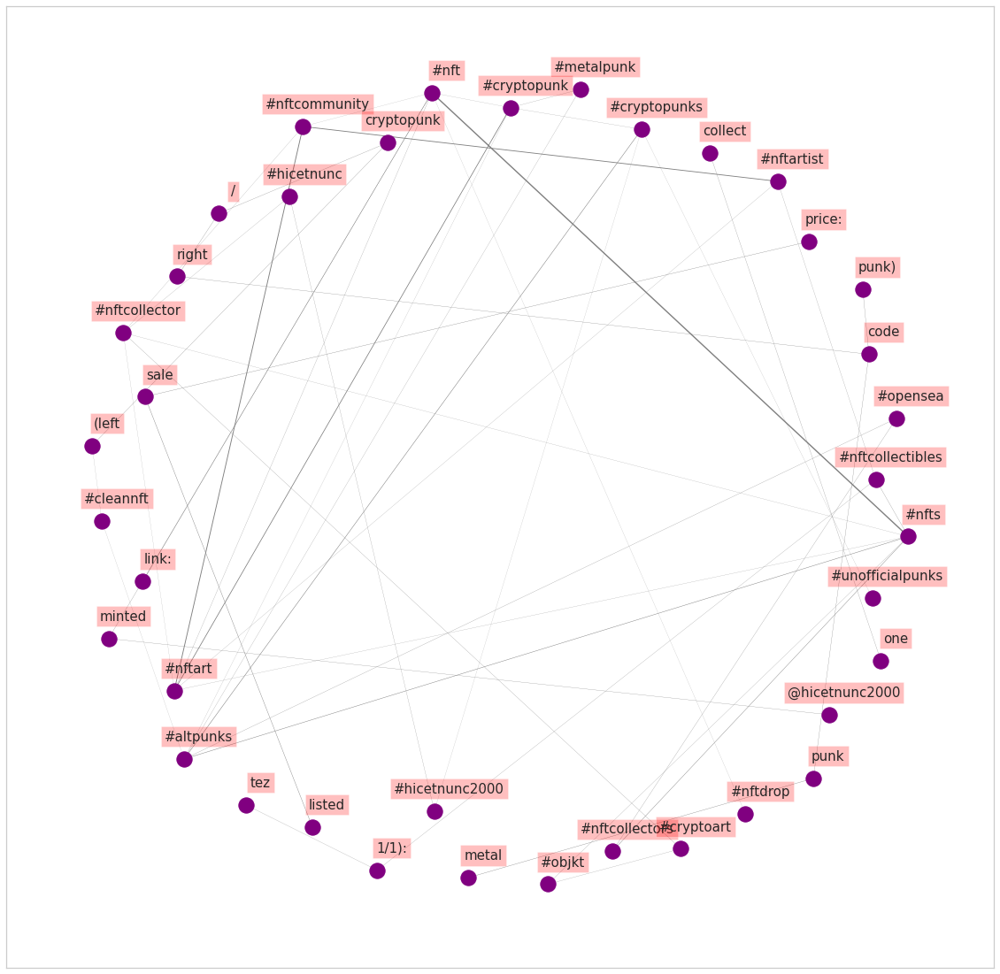

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))

pos = nx.spring_layout(G, k=10)
edgewidth = [d['weight'] for (u,v,d) in G.edges(data=True)]


# Plot networks
nx.draw_networkx(G, pos,
                 font_size=10,
                 width=edgewidth,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)
plt.grid(None)
# Create offset labels
for key, value in pos.items():
    x, y = value[0]+0.035, value[1]+0.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=15)
    
plt.show()

In [ ]:
sorted(G.degree, key=lambda x: x[1], reverse=True)

[('#nft', 7),
 ('#nfts', 7),
 ('#nftart', 6),
 ('#altpunks', 6),
 ('#cryptopunk', 5),
 ('#nftcollector', 5),
 ('#cryptopunks', 4),
 ('#nftcommunity', 4),
 ('#nftartist', 3),
 ('code', 3),
 ('#nftcollectibles', 3),
 ('#nftcollectors', 2),
 ('sale', 2),
 ('punk', 2),
 ('right', 2),
 ('/', 2),
 ('(left', 2),
 ('cryptopunk', 2),
 ('minted', 2),
 ('#opensea', 2),
 ('#cryptoart', 2),
 ('#hicetnunc', 2),
 ('#hicetnunc2000', 2),
 ('1/1):', 2),
 ('#objkt', 2),
 ('#metalpunk', 2),
 ('#cleannft', 2),
 ('listed', 1),
 ('link:', 1),
 ('metal', 1),
 ('price:', 1),
 ('punk)', 1),
 ('@hicetnunc2000', 1),
 ('collect', 1),
 ('one', 1),
 ('tez', 1),
 ('#unofficialpunks', 1),
 ('#nftdrop', 1)]

In [ ]:
nx.betweenness_centrality(G)


{'#nft': 0.18912662662662666,
 '#nfts': 0.31213713713713703,
 '#cryptopunks': 0.08883883883883884,
 '#cryptopunk': 0.11053553553553552,
 '#nftart': 0.05476726726726728,
 '#nftcommunity': 0.013388388388388387,
 '#nftartist': 0.007882882882882882,
 '#altpunks': 0.37408658658658667,
 '#nftcollectors': 0.009922422422422424,
 'listed': 0.0,
 'sale': 0.0015015015015015015,
 'link:': 0.0,
 'metal': 0.0,
 'punk': 0.046546546546546545,
 'price:': 0.0,
 'code': 0.13363363363363362,
 'right': 0.16816816816816815,
 '/': 0.20270270270270271,
 '(left': 0.2627627627627628,
 'cryptopunk': 0.23423423423423423,
 'punk)': 0.0,
 '#nftcollectibles': 0.09794794794794795,
 'minted': 0.046546546546546545,
 '@hicetnunc2000': 0.0,
 'collect': 0.0,
 'one': 0.0,
 '#opensea': 0.010635635635635635,
 '#cryptoart': 0.002377377377377377,
 '#nftcollector': 0.07382382382382383,
 '#hicetnunc': 0.01251251251251251,
 '#hicetnunc2000': 0.014264264264264262,
 '1/1):': 0.046546546546546545,
 '#objkt': 0.015140140140140139,
 '